# Notebook to compute the LSST's passbands and the impact of the atmospheric parameters on the colors of reference sources 

In this notebook we are going to take the reference spectra from the pysynphot's spectral atlases and make them pass through the LSST's throughput and the simulated atmospheres from the previous notebooks. 

This notebook requires [pysynphot](https://pysynphot.readthedocs.io/en/latest/) 

# Load necessary packages 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import pysynphot as S
from scipy.interpolate import interp1d
from astropy.io import fits

# allow interactive plots
#%matplotlib widget

In [2]:
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 45238.93416
   waveset: Min: 500, Max: 26000, Num: 10000, Delta: None, Log: True


# Set LSST's parameters 

In [3]:
WLMIN=3400. # Minimum wavelength : PySynPhot works with Angstrom
WLMAX=10600. # Minimum wavelength : PySynPhot works with Angstrom

NBINS=int(WLMAX-WLMIN) # Number of bins between WLMIN and WLMAX
BinWidth=(WLMAX-WLMIN)/float(NBINS) # Bin width in Angstrom
WL=np.linspace(WLMIN,WLMAX,NBINS)   # Array of wavelength in Angstrom
# from key numbers
Reff=642.3/2. # effective radius in cm
Seff= np.pi*Reff**2  # in cm2
print(Seff)
exptime=30.0

324015.4546769212


In [4]:
S.refs.setref(area=Seff, waveset=None) # set by default to 6.4230 m effective aperture 
S.refs.set_default_waveset(minwave=WLMIN, maxwave=WLMAX, num=NBINS, delta=BinWidth, log=False)
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 324015.4546769212
   waveset: Min: 3400.0, Max: 10600.0, Num: None, Delta: 1.0, Log: False


# Define general paths 

In [5]:
outdir_plots0 = 'output_plots/'
if os.path.exists(outdir_plots0)==False:
    os.mkdir(outdir_plots0)
outdir_files = 'output_files/'
if os.path.exists(outdir_files)==False:
    os.mkdir(outdir_files)

# Define paths to spectral atlases 

In [6]:
pysynphot_root_path=os.environ['PYSYN_CDBS']
path_dict = {
    'calspec':os.path.join(pysynphot_root_path,'calspec'),
    'bpgs':os.path.join(pysynphot_root_path,'grid/bpgs'),
    'jacoby':os.path.join(pysynphot_root_path,'grid/jacobi'),
    'pickles':os.path.join(pysynphot_root_path,'grid/pickles/dat_uvk')
}

atlas_dir = 'spectral_atlases/'
file_dict = {
    'calspec':'',
    'bpgs':os.path.join(atlas_dir,'atlas_bpgs.txt'),
    'jacoby':os.path.join(atlas_dir,'atlas_jacoby.txt'),
    'pickles':os.path.join(atlas_dir,'atlas_pickles.txt')
}


# Select a spectral atlas 

Options: 
* calspec (HST calibration spectra): work in progress, need to separate stars from AGNs and other sources 
* bpgs (Bruzual-Persson-Gunn-Stryker): 175 spectra 
* jacobi (Jacoby-Hunter-Christian): 161 spectra 
* pickles (Pickles): 131 spectra 

In [7]:
atlas_name = 'pickles'

atlas_path = path_dict[atlas_name]
atlas_file = file_dict[atlas_name]

# Find the spectra files and information 

In [8]:
#path_sed_calspec=os.path.join(pysynphot_root_path,'calspec')
atlas_seds = pd.read_csv(atlas_file)
atlas_seds

,File,Type,Teff,Name
0,pickles_uk_1.fits,O5V,39810.70,unknown
1,pickles_uk_2.fits,O9V,35481.40,unknown
2,pickles_uk_3.fits,B0V,28183.80,unknown
3,pickles_uk_4.fits,B1V,22387.20,unknown
4,pickles_uk_5.fits,B3V,19054.60,unknown
...,...,...,...,...
126,pickles_uk_127.fits,G8I,4591.98,unknown
127,pickles_uk_128.fits,K2I,4255.98,unknown
128,pickles_uk_129.fits,K3I,NaN,unknown
129,pickles_uk_130.fits,K4I,3990.25,unknown


# Load with pysynphot the spectra from the selected atlas 

In [9]:
sed_list = np.array(atlas_seds['File'])

In [10]:
sed_dict = {}
type_dict = {}
for i,sed in enumerate(sed_list):
    #print('-------')
    #print(sed)
    spec_ = S.FileSpectrum(os.path.join(atlas_path,sed))
    sed_dict[sed[:-5]] = spec_
    type_dict[sed[:-5]] = atlas_seds['Type'][i]

# Define also the spectral types 

In [11]:
spectral_types = ['O','B','A','F','G','K','M']

<img align="center" src = Stellar_Classification_Chart.png width=750 style="padding: 10px"> 

https://upload.wikimedia.org/wikipedia/commons/3/37/Stellar_Classification_Chart.png

# Organise spectra by spectral type 

In [12]:
spec_by_type = {}
for i in range(len(spectral_types)):
    spec_type = spectral_types[i]
    
    type_list_ = []
    spec_by_type[spec_type] = []
    for sed_ in type_dict.keys():
        if spec_type in type_dict[sed_]:
            type_list_.append(type_dict[sed_])
            spec_by_type[spec_type].append(sed_dict[sed_])
    print(spec_type, type_list_)
    print(len(type_list_))
    print('-----------')

O ['O5V', 'O9V', 'O8III']
3
-----------
B ['B0V', 'B1V', 'B3V', 'B57V', 'B8V', 'B9V', 'B2IV', 'B6IV', 'B12III', 'B3III', 'B5III', 'B9III', 'B2II', 'B5II', 'B0I', 'B1I', 'B3I', 'B5I', 'B8I']
19
-----------
A ['A0V', 'A2V', 'A3V', 'A5V', 'A7V', 'A0IV', 'A47IV', 'A0III', 'A3III', 'A5III', 'A7III', 'A0I', 'A2I']
13
-----------
F ['F0V', 'F2V', 'F5V', 'wF5V', 'F6V', 'rF6V', 'F8V', 'wF8V', 'rF8V', 'F02IV', 'F5IV', 'F8IV', 'F0III', 'F2III', 'F5III', 'F0II', 'F2II', 'F0I', 'F5I', 'F8I']
20
-----------
G ['G0V', 'wG0V', 'rG0V', 'G2V', 'G5V', 'wG5V', 'rG5V', 'G8V', 'G0IV', 'G2IV', 'G5IV', 'G8IV', 'G0III', 'G5III', 'wG5III', 'rG5III', 'G8III', 'wG8III', 'G5II', 'G0I', 'G2I', 'G5I', 'G8I']
23
-----------
K ['K0V', 'rK0V', 'K2V', 'K3V', 'K4V', 'K5V', 'K7V', 'K0IV', 'K1IV', 'K3IV', 'K0III', 'wK0III', 'rK0III', 'K1III', 'wK1III', 'rK1III', 'K2III', 'wK2III', 'rK2III', 'K3III', 'wK3III', 'rK3III', 'K4III', 'wK4III', 'rK4III', 'K5III', 'rK5III', 'K01II', 'K34II', 'K2I', 'K3I', 'K4I']
32
-----------
M [

Now we can plot them by spectral type separately 

In [13]:
type_colors = {'O':'b','B':'dodgerblue','A':'cyan','F':'g','G':'gold','K':'r','M':'brown'}

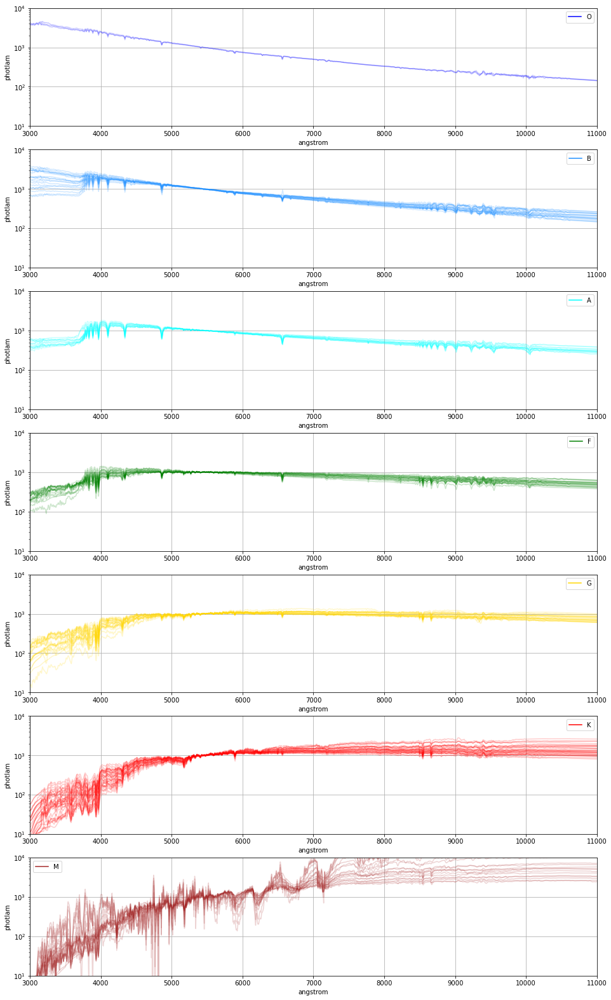

In [14]:
num_rows = len(spectral_types)
fig, axs = plt.subplots(num_rows, 1, figsize=(16,28))

for row,st in enumerate(spectral_types):
    for spec in spec_by_type[st]:
        spec.convert('photlam')
        axs[row].plot(spec.wave,spec.flux,color=type_colors[st],alpha=0.2)
    axs[row].plot([],[],label=st,color=type_colors[st])
    axs[row].grid()
    #axs[row].set_yscale("log")
    axs[row].set_xlabel(spec.waveunits)
    axs[row].set_ylabel(spec.fluxunits)
    axs[row].legend()
    axs[row].set_xlim(3000,11000)
    axs[row].set_ylim(10,10000)
    axs[row].set_yscale("log")
            

# Load LSST's throughput 

https://github.com/lsst/throughputs/tree/main/baseline

In [15]:
throughput_path = 'data/lsst/'
throughput_label = 'hardware_{0}.dat'

In [16]:
filters = ['u','g','r','i','z','Y']
filter_names = {0:'u',1:'g',2:'r',3:'i',4:'z',5:'Y'}
filter_colors = {0:'b',1:'g',2:'r',3:'orange',4:'k',5:'grey'}

Write the throughputs in pysynphot format 

In [17]:
lsst_bp = []
for f in filters:
    throughput_ = np.loadtxt(throughput_path+throughput_label.format(f.lower()))
    wl = throughput_[:,0]*10.
    lsst_bp.append(S.ArrayBandpass(wl, throughput_[:,1] , name=f))


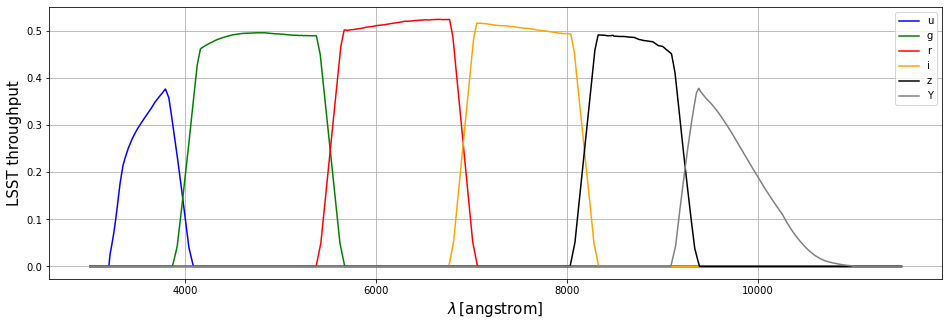

In [18]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for index in range(len(lsst_bp)):
    ax.plot(lsst_bp[index].wave,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()

In [19]:
for filter in lsst_bp:
    assert (filter.wave==lsst_bp[0].wave).all()

In [20]:
wl_lsst = lsst_bp[0].wave

# Load simulated transparencies 

Select variable parameter and specify airmass and clouds 

In [21]:
variable_param = 'aerosol'
am0 = 1.2
cloud0 = 0.0
pwv0 = 3.0
aero0 = 0.04

Specify which distribution follows the simulated parameter. Options: 
* linear_distribution-discrete: generated following a linear function and with pre-established step (e.g., PWV = 1.0, 2.0, 3.0, ....) 
* linear_distribution-continuous: generated following a linear function and specifying only the value range and number of simulations (e.g., PWV = 1.0, 1.25, 1.5, ....) 
* uniform_distribution: generated following a uniform random distribution (work in progress) 
* specific_distribution: generated following random distributions specific to each parameter (work in progress) 


In [22]:
param_dist = 'linear_distribution-discrete'

In [23]:
outdir_plots_ = os.path.join('output_plots/',param_dist.split('-')[0])
if os.path.exists(outdir_plots_)==False:
    os.mkdir(outdir_plots_)

outdir_plots = os.path.join('output_plots/',param_dist.replace('-','/'))
if os.path.exists(outdir_plots)==False:
    os.mkdir(outdir_plots)

In [24]:
if variable_param=='airmass' or variable_param=='cloud':
    t_file = 'simulated_transparencies_varying_{0}.fits'.format(variable_param)
    t_file_ref = 'simulated_transparencies_varying_{0}_ref.fits'.format(variable_param)
else:
    t_file = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}.fits'.format(variable_param,am0,cloud0)
    t_file_ref = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}_ref.fits'.format(variable_param,am0,cloud0)

t_path = os.path.join('./simulated_transparencies/',param_dist.replace('-','/'))
t_in = os.path.join(t_path,t_file)
t_in_ref = os.path.join(t_path,t_file_ref)
t = fits.open(t_in)
t_ref = fits.open(t_in_ref)

In [25]:
head = t[0].header
data = t[0].data
print(data.shape)
data_ref = t_ref[0].data
print(data_ref.shape)

(10, 956)
(2, 956)


In [26]:
n_atmp = head['ID_RES']
n_sim = head['NTRANSP']
print(n_atmp, n_sim)

5 9


In [27]:
wl_t = data[0][n_atmp:]*10.

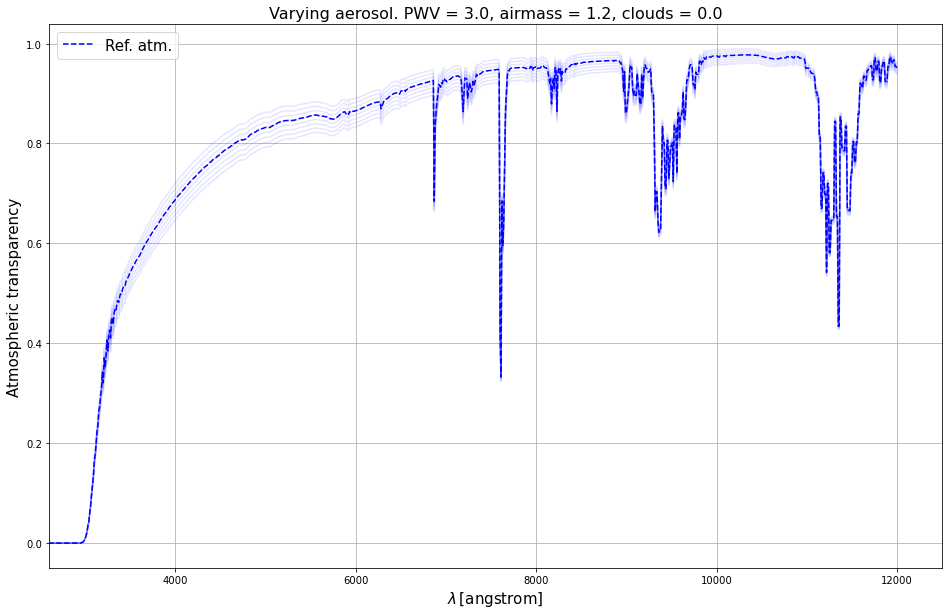

In [28]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for atm_i in range(1,n_sim):
    ax.plot(wl_t,data[atm_i][n_atmp:],color='b',alpha=0.1)
ax.plot(wl_t,data_ref[1][n_atmp:],ls='--',color='b',label='Ref. atm.')
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \,$'+'[angstrom]',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)
plt.legend(fontsize=15)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

# Check range of values of variable parameter 

In [29]:
print(head)

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  956                                                  NAXIS2  =                   10                                                  NTRANSP =                    9                                                  ID_AM   =                    4                                                  ID_VAOD =                    1                                                  ID_PWV  =                    0                                                  ID_O3   =                    2                                                  ID_CLD  =                    3                                                  ID_RES  =                    5                                                  END                                     

In [30]:
params_index = {'pwv':0,'aerosol':1,'ozone':2,'cloud':3,'airmass':4}

In [31]:
var_index = params_index[variable_param]

In [32]:
#data[1:,1]
print(data[1:,var_index])

[0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09]


# Select data for variable parameter of these simulations 

In [33]:
atm_vals = data[1:,var_index]

In [34]:
np.save('output_files/atm_vals_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),atm_vals)

# Convert simulated transparencies into pysynphot format 

In [35]:
atm_transp = []
for i in range(1,n_sim+1):
    finterp_i = interp1d(wl_t,data[i][n_atmp:],bounds_error=False,fill_value=0.)
    atm_interp_i = finterp_i(wl_lsst)
    #atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
    atm_i = S.ArrayBandpass(wl_lsst,atm_interp_i, name='Atm. transp. {0}'.format(i))
    atm_transp.append(atm_i)

In [36]:
finterp_ref = interp1d(wl_t,data_ref[1][n_atmp:],bounds_error=False,fill_value=0.)
atm_interp_ref = finterp_ref(wl_lsst)
#atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
atm_transp_ref = S.ArrayBandpass(wl_lsst,atm_interp_ref, name='Atm. transp. {0}'.format(i))

# Compute total bandpass (atmosphere(s) x LSST throughput) 

In [37]:
total_passband = {}
#for bpname in filters:
#    total_passband[bpname] = []

for index,bp in enumerate(lsst_bp):
    total_passband[filters[index]] = []
    for i in range(n_sim):
        total_pass = bp*atm_transp[i]
        total_passband[bp.name].append(total_pass)

In [38]:
total_passband_ref = {}
for index,bp in enumerate(lsst_bp):
    total_pass = bp*atm_transp_ref
    total_passband_ref[bp.name] = total_pass

In [39]:
print(len(total_passband['u']))
print(total_passband['u'][0])

9
(u * Atm. transp. 1)


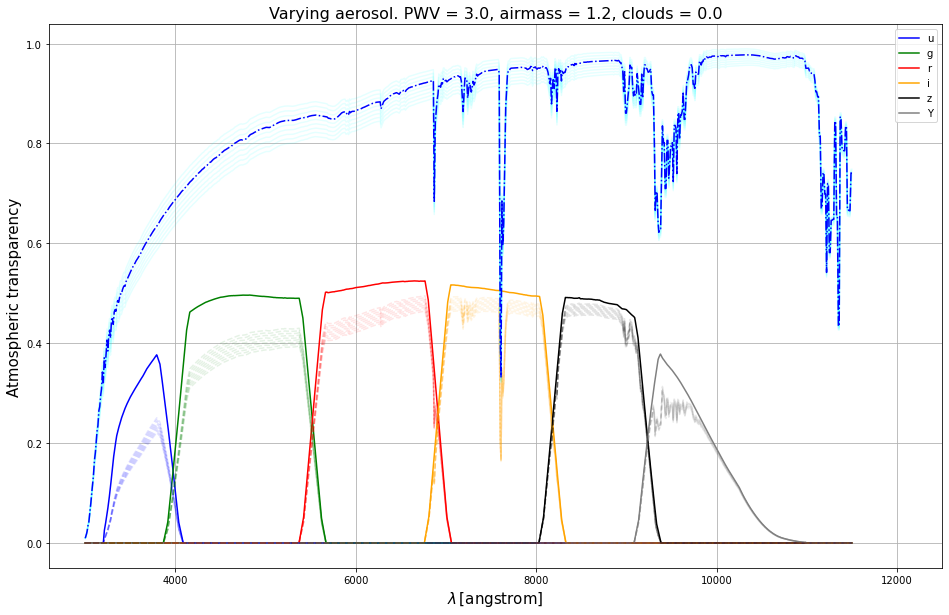

In [40]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for index,bp in enumerate(lsst_bp):
    ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])

for isim in range(n_sim):
    ax.plot(atm_transp[isim].wave,atm_transp[isim].throughput,alpha=0.1,color='cyan')
    for index,bpname in enumerate(filters):
        ax.plot(total_passband[bpname][isim].wave,total_passband[bpname][isim].throughput,ls='--',color=filter_colors[index],alpha=0.1)        
ax.plot(atm_transp_ref.wave,atm_transp_ref.throughput,ls='-.',color='b')        
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.legend()
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'total_passbands_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Plot the atmospheric transparencies corresponding to the minimum and maximum atmospheric parameter that we are varying: 

In [41]:
min_val_ = np.min(atm_vals)
max_val_ = np.max(atm_vals)
print(min_val_,max_val_)

0.01 0.09


In [42]:
min_ind_ = np.where(atm_vals==min_val_)[0][0]
max_ind_ = np.where(atm_vals==max_val_)[0][0]

In [43]:
min_transp = data[1+min_ind_,n_atmp:]
max_transp = data[1+max_ind_,n_atmp:]

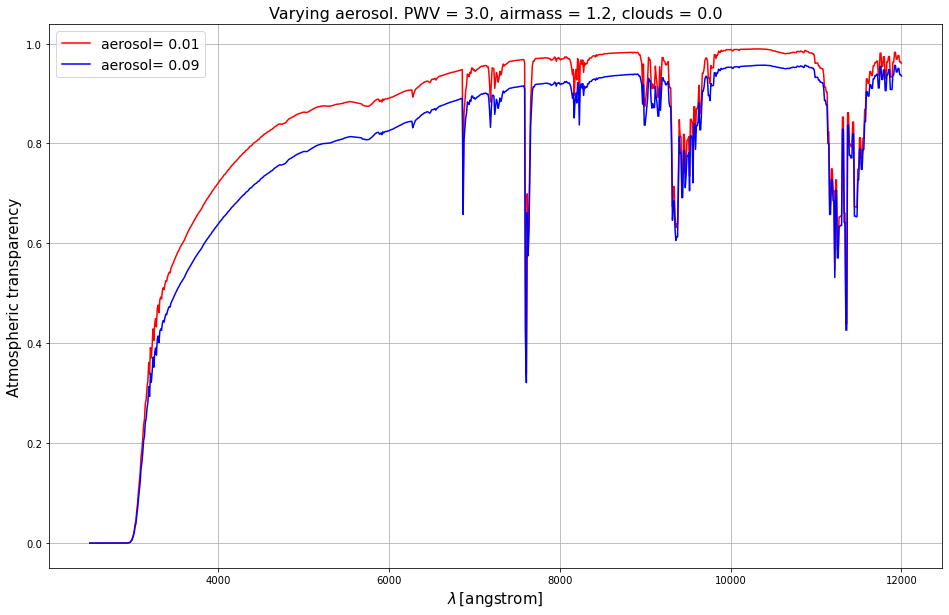

In [44]:
fig=plt.figure(figsize=(16,10))
plt.plot(wl_t,min_transp,color='r',label=variable_param+'= {0:.2f}'.format(min_val_))
plt.plot(wl_t,max_transp,color='b',label=variable_param+'= {0:.2f}'.format(max_val_))
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.grid()
plt.legend(fontsize=14)
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}_min_max_values.png'.format(variable_param,am0,cloud0)))

# Calculate fluxes through total passbands 

Let's start with one spectrum of a type A star as example 

In [45]:
# Example with one spectrum 
test_type = 'A'
test_spec = 0
example_spec = spec_by_type[test_type][test_spec]

In [46]:
# It seems this galaxy is a small enough place to end up choosing again, just by coincidence, Vega as example star 
vega = S.Vega
vega.convert('photlam')

photlam


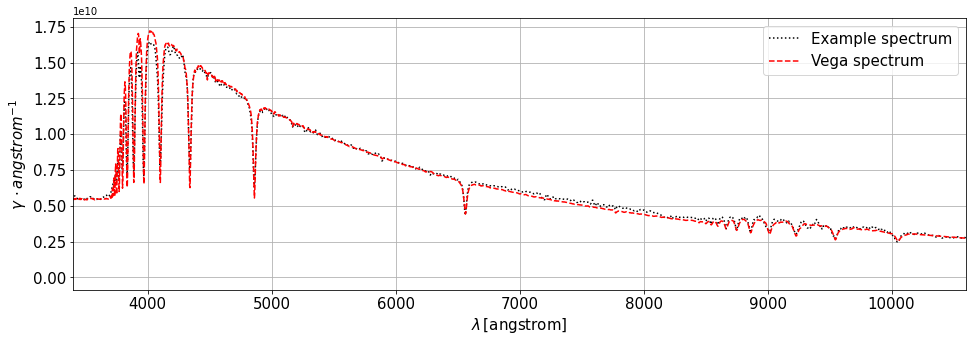

In [47]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0,label='Example spectrum')
plt.plot(vega.wave,vega.flux*Seff*exptime,ls='--',color='r',alpha=1.0,label='Vega spectrum')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(example_spec.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

Let's make the example spectrum pass through the atmosphere and through the total passband (atm. x throughput) 

In [48]:
obsatm_dict = {}
for isim in range(n_sim):
    obsatm_dict[isim] = []
    obsatm = S.Observation(example_spec,atm_transp[isim],force='taper')
    obsatm_dict[isim] = obsatm

obstotal_dict = {}
for filter in filters:
    obstotal_dict[filter] = []

#for filter in lsst_bp:
for filter in filters:
    #print(filter.name.upper())
    for i in range(n_sim):
        #total_pass = filter*atm_transp[i]
        #obs = S.Observation(spec,total_pass,force='taper')
        obstotal = S.Observation(example_spec,total_passband[filter][i],force='taper')
        obstotal_dict[filter].append(obstotal)

(Atm. transp. 1) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 2) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 3) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 4) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 5) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 6) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 7) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 8) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 9) does not have a defined

u
g
r
i
z
Y
photlam


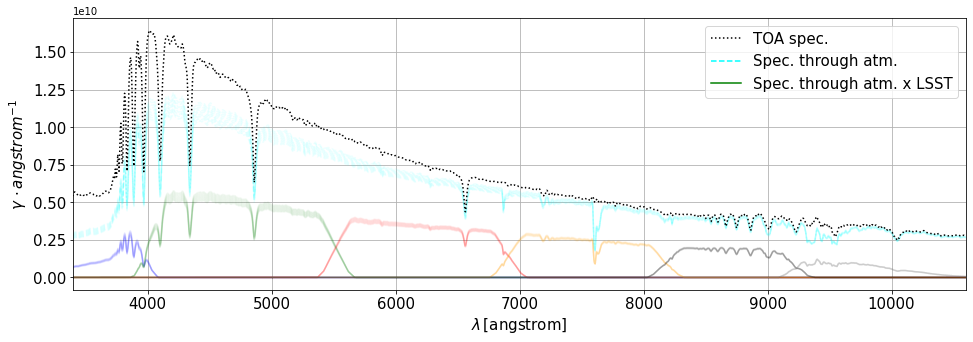

In [49]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for isim in range(n_sim):
    obsatm = obsatm_dict[isim]
    ax.plot(obsatm.binwave,obsatm.binflux*Seff*exptime,ls='--',color='cyan',alpha=0.07)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0)
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls=':',color='k',label='TOA spec.')
plt.plot([],[],ls='--',color='cyan',label='Spec. through atm.')
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

This was an example of how the spectrum looks like when passing only through the atmosphere and through the total passbands. For our calibration purposes, what we actually want is to have the spectra passing through either only the troughput (as if the telescope was on space) and through the total passband (ground-based telescope). Now let's pass all spectra through the throughput and through the atmosphere x throughput 

In [50]:
# Spectra through atm x throughput 
obs_dict = {}
#for sed_ in list(sed_dict.keys()):
for st in spectral_types:
    print(st)
    obs_dict_ = {}
    for si,spec in enumerate(spec_by_type[st]):
        filter_dict_ = {}
        for filter in filters:
            filter_dict_[filter] = []
            for i in range(n_sim):
                obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
                filter_dict_[filter].append(obs_spec)
        obs_dict_[si] = filter_dict_ 
    obs_dict[st] = obs_dict_


O
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [51]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(obs_dict[test_type].keys()))
#print(len(obs_dict[example_spec].keys()))
print(len(obs_dict[test_type][test_spec].keys()))
print(len(obs_dict[test_type][test_spec]['u']))
print(n_sim)

131
7
13
6
9
9


In [52]:
# Spectra only through throughput (as if telescope was in space) 
obs_dict_t = {}
for st in spectral_types:
    print(st)
    obs_dict_t_ = {}
    for si,spec in enumerate(spec_by_type[test_type]):
        filter_dict_ = {}
        for filter in lsst_bp:
            obs_spec_t = S.Observation(spec,filter,force='taper')
            filter_dict_[filter.name] = obs_spec_t
        obs_dict_t_[si] = filter_dict_ 
    obs_dict_t[st] = obs_dict_t_
    

O
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset 

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

In [53]:
print(len(sed_dict.keys()))
print(len(obs_dict_t.keys()))
print(len(obs_dict_t[test_type].keys()))
print(len(obs_dict_t[test_type][test_spec].keys()))

131
7
13
6


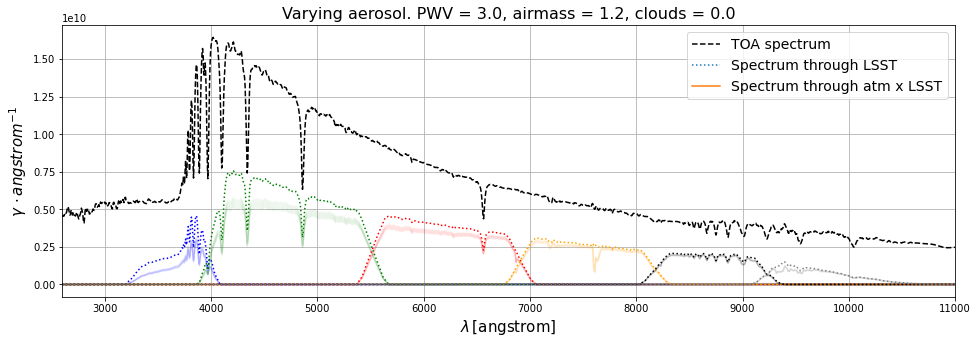

In [54]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
spec_by_type[test_type][test_spec].convert('photlam')
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(obs_dict_t[test_type][test_spec][filter].wave,obs_dict_t[test_type][test_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = obs_dict[test_type][test_spec][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Now we look at the same information but restricted to the most extreme atmospheric parameter values:

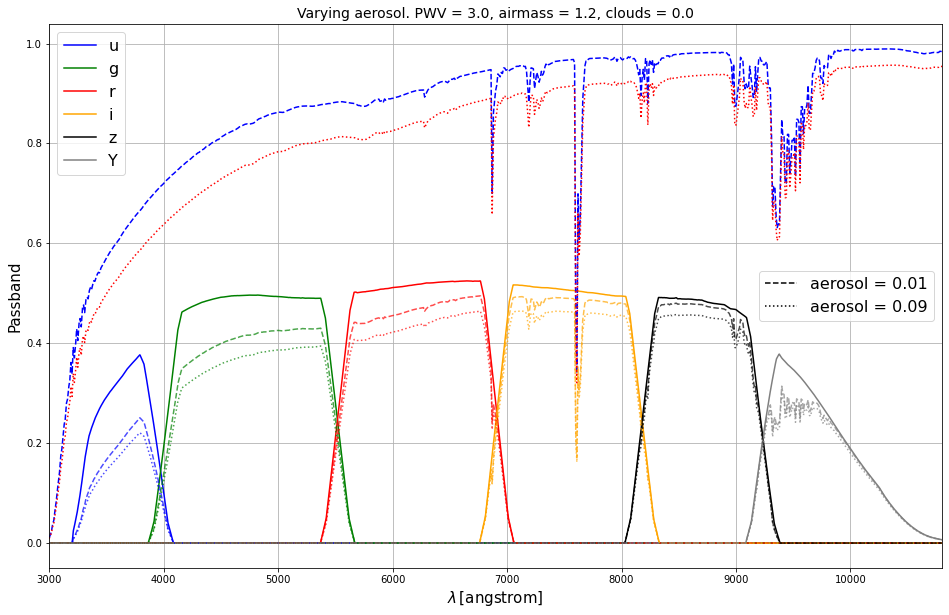

In [55]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
legend_lines1 = []
for index,bp in enumerate(lsst_bp):
    line_, = ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])
    legend_lines1.append(line_)

ax.plot(atm_transp[min_ind_].wave,atm_transp[min_ind_].throughput,ls='--',alpha=1.0,color='b')
ax.plot(atm_transp[max_ind_].wave,atm_transp[max_ind_].throughput,ls=':',alpha=1.0,color='r')

for index,bpname in enumerate(filters):
    ax.plot(total_passband[bpname][min_ind_].wave,total_passband[bpname][min_ind_].throughput,ls='--',color=filter_colors[index],alpha=0.7)
    ax.plot(total_passband[bpname][max_ind_].wave,total_passband[bpname][max_ind_].throughput,ls=':',color=filter_colors[index],alpha=0.7)        
line1, = plt.plot([],[],ls='--',color='k',label='{0} = {1}'.format(variable_param,min_val_))
line2, = plt.plot([],[],ls=':',color='k',label='{0} = {1}'.format(variable_param,max_val_))
legend_lines2 = [line1,line2]
plt.xlim(3000.,10800.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Passband',fontsize=15)
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=14)
legend1 = plt.legend(handles=legend_lines1,fontsize=16,loc="upper left")
plt.gca().add_artist(legend1)
plt.legend(handles=legend_lines2,fontsize=16,loc="center right")
plt.savefig(os.path.join(outdir_plots,'total_passbands_min_max_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

u
g
r
i
z
Y
photlam


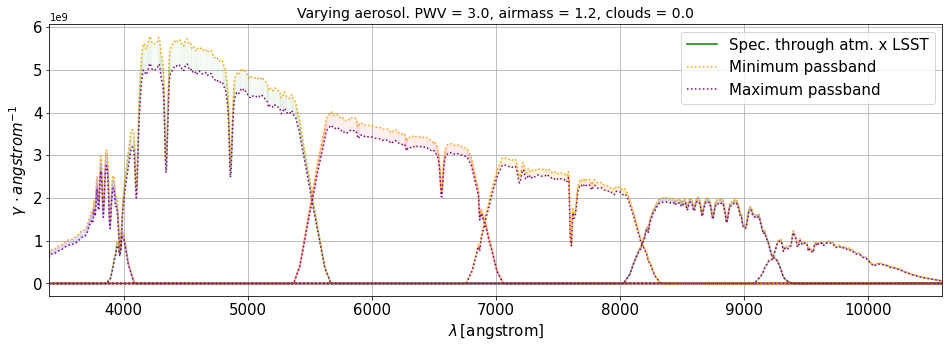

In [56]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
    ax.plot(obstotal_dict[filter][min_ind_].binwave,obstotal_dict[filter][min_ind_].binflux*Seff*exptime,ls=':',color='orange')
    ax.plot(obstotal_dict[filter][max_ind_].binwave,obstotal_dict[filter][max_ind_].binflux*Seff*exptime,ls=':',color='purple')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.plot([],[],ls=':',color='orange',label='Minimum passband')
plt.plot([],[],ls=':',color='purple',label='Maximum passband')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=14)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_min_max_total_passband_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))
print(spec.fluxunits)

# Calculate magnitudes with our own function 

Physical constants 

In [57]:
c_light = S.units.C #speed of light [Angstrom /s] 
print(c_light)
h_planck = S.units.H #Planck's constant [erg*s] 
print(h_planck)

2.99792458e+18
6.6262e-27


In [58]:
# Reference flux value for an AB source in erg / s / cm2 / Hz 
f_ref = 3.63*10**(-20)

In [59]:
# Pivot wavelength [cm] 
wl_piv = 5.4929*10**(-5)

In [60]:
C = f_ref/(h_planck*wl_piv*10**8.)
print(C)

997.3334660532323


Definition of functions 

In [61]:
# The SED of an AB source (that is, constant flux in frequency units) expressed in photons / s / cm^2 / Angstrom 
def ABnphot(wl):
    #return 997.2*5500./wl
    return C*wl_piv*10**8./wl

We check that this function actually creates a spectrum with the properties of an AB source, that is, a flat spectrum in fnu units (erg/s/cm2/Hz) 

Text(0, 0.5, 'Flux [Jy]')

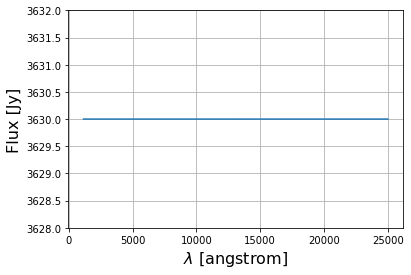

In [62]:
checkab = ABnphot(example_spec.wave)
checkab_ = S.ArraySpectrum(example_spec.wave, checkab, name='Flat AB spectrum')
#plt.plot(checkab_.wave,checkab_.flux)
checkab_.convert('fnu')
plt.plot(checkab_.wave,checkab_.flux*10**23.)
plt.ylim(3.628*10.**3,3.632*10**3.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel('Flux [Jy]',fontsize=16)

Now, we define our function to compute the AB magnitudes: 
$$m_{AB} = -2.5 \log_{10} \frac{\int F_{\nu}^E(\lambda) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda) \frac{d\lambda}{h \lambda}}{\int F_{\nu, AB}^E \cdot S_{eff} \cdot t_{exp} \cdot S_{throughput}(\lambda) \frac{d\lambda}{h \lambda}} = -2.5 \log_{10} \frac{A}{B} \, . $$ 
Now, we want to compute the error for the AB magnitudes. The denominator is constant for a given $S_{throughput}(\lambda)$, so we assume it does not contribute to the error. Then, we can approximate $A$ as 
$$A \approx \sum_i F_{\nu}^E(\lambda_i) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda_i) \frac{\Delta \lambda_i}{h \lambda_i} = \sum_i n_i \cdot S_{passband}(\lambda_i) \, , $$ 
where $n_i$ is the number of photo-electrons received within a given bin of wavelength, $\Delta \lambda_i$. Then, we can assume that $n_i$ is a Poisson random variable, so 
$$\sigma^2_{n_i} = n_i . $$ 
Taking this into account, we can write the error of $A$ as 
$$\sigma^2_A = \sum_i \left( \frac{\partial A}{\partial n_i} \right)^2 \sigma^2_{n_i} = \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, , $$ 
therefore, 
$$\sigma_A = \sqrt{n_i} \, . $$
Finally, the error on $m_{AB}$ is given by 
$$\sigma^2_{m_{AB}} = \left( \frac{\partial m_{AB}}{\partial A} \right)^2 \sigma^2_A = \left( \frac{-2.5}{A \log 10} \right)^2 \cdot \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, . $$ 


In [63]:
def myAB(spec,passband,filter,return_error=False):
    f_units = str(spec.fluxunits)
    if f_units!='fnu':
        print('ATTENTION: converting flux units to fnu')
        spec.convert('fnu')
        
    observation = S.Observation(spec,passband,force='taper')
    print('Observation units = ', observation.fluxunits)
    nan_mask = np.isnan(observation.flux)
    
    obs_wave_ = observation.wave[~nan_mask]
    obs_flux_ = observation.flux[~nan_mask]
    wave_min = np.min(observation.wave[~nan_mask])
    wave_max = np.max(observation.wave[~nan_mask])

    num = np.trapz(obs_flux_/obs_wave_,x=obs_wave_)*Seff*exptime/h_planck
    
    if return_error:
        finterp_pb = interp1d(passband.wave,passband.throughput,bounds_error=False,fill_value=0.)
        pb_interp = finterp_pb(spec.wave)
        
        delta_lambda = list(np.diff(spec.wave))
        delta_lambda.append(spec.wave[-1]-spec.wave[-2])
        delta_lambda = np.array(delta_lambda)
        assert len(delta_lambda)==len(spec.wave)
        
        assert str(spec.fluxunits)=='fnu'
        n_i = spec.flux*delta_lambda*Seff*exptime/(spec.wave*h_planck)
        print('n_i = ', n_i)
        print('Number of collected photoelectrons = {0:.2e}'.format(np.sum(n_i*pb_interp)))
        err2_num = np.sum(n_i*np.array(pb_interp)**2.)
    
    spec.convert(f_units)
    
    print('Numerator = {0:.2e}'.format(num))
    if return_error:
        print('Variance of the numerator = {0:.2e}'.format(err2_num))
    
    flatsp_nphot = ABnphot(spec.wave)
    flatsp_ = S.ArraySpectrum(spec.wave, flatsp_nphot, name='Flat AB spectrum')
    
    flatsp_.convert('fnu')
    ab_obs = S.Observation(flatsp_,filter,force='taper')
    print('AB observation units = ', ab_obs.fluxunits)
    
    ab_wave_ = ab_obs.wave[~nan_mask]
    ab_flux_ = ab_obs.flux[~nan_mask]
    
    den = np.trapz(ab_flux_/ab_wave_,x=ab_wave_)*Seff*exptime/h_planck
    
    print('Denominator = {0:.2e}'.format(den))
    #print(num/den)
    #print(obmag)
    mab = -2.5*np.log10(num/den)
    print('AB magnitude = ', mab)
    print('---------')
    
    if return_error:
        err2_mab = (2.5**2./np.log(10.)**2.)*err2_num/num**2.
        err_mab = np.sqrt(err2_mab)
        
        return mab,err_mab
    else:
        return mab

In [64]:
# This function gives the flux of an AB source in photons / s / cm^2 / Angstrom 
flatsp_nphot = ABnphot(example_spec.wave)

In [65]:
#Let's write this in pysynphot format (note that the result will be in photlam units, then we use ABnphot as input)
flatsp = S.ArraySpectrum(example_spec.wave, flatsp_nphot, name='Flat AB spectrum')

Now we check that the AB magnitudes are zero for the flat AB spectrum (they have to be through any filter, by definition) 

In [66]:
for filter in lsst_bp:
    myAB(flatsp,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.09e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.16e+12
(r) does not have a defined binset in the w

We check the same for the total passband. Note that, given the definition of AB magnitudes that we have implemented, the denominator only considers the throughput of the telescope, even when the spectra pass through the total passband, since the "reference" we want to compare to is when there is no effect of the atmosphere, but in any case the light passes through the telescope, so we consider the telescope's throughput to be the reference (i.e. as if it had a transmission = 1) with respect to which the flux is attenuated. Therefore, the following AB magnitudes of a flat AB spectrum should be different from (greater than) zero  

In [67]:
for fi,filter in enumerate(filters):
    myAB(flatsp,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.88e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5375197178058375
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.79e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.20744411491687778
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obs

Make the flat spectrum pass through the throughputs and total passbands 

In [68]:
flat_dict_t = {}
for fi,filter in enumerate(filters):
    flat_spec_t_ = S.Observation(flatsp,lsst_bp[fi],force='taper')
    flat_dict_t[filter] = flat_spec_t_

flat_dict = {}
for fi,filter in enumerate(filters):
    flat_dict[filter] = []
    for i in range(n_sim):
        flat_spec_ = S.Observation(flatsp,total_passband[filter][i],force='taper')
        flat_dict[filter].append(flat_spec_)

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum wi

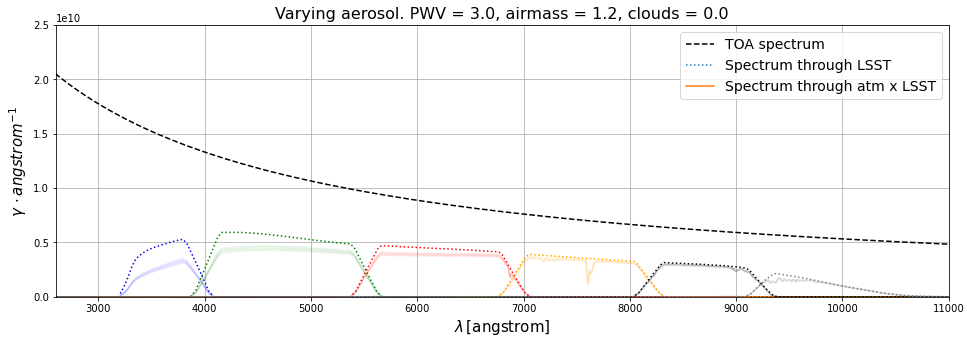

In [69]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
if str(flatsp.fluxunits)!='photlam':
    flatsp.convert('photlam')
plt.plot(flatsp.wave,flatsp.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(flat_dict_t[filter].wave,flat_dict_t[filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = flat_dict[filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.ylim(0.,2.5e10)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'flat_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Now, let's see the AB magnitudes of the example spectrum with myAB function. To better understand it, we can compare the AB spectrum and the example spectrum (Vega) flux amplitudes in each range of wavelengths (see plot below) 

photlam


Text(0, 0.5, '$\\gamma / angstrom$')

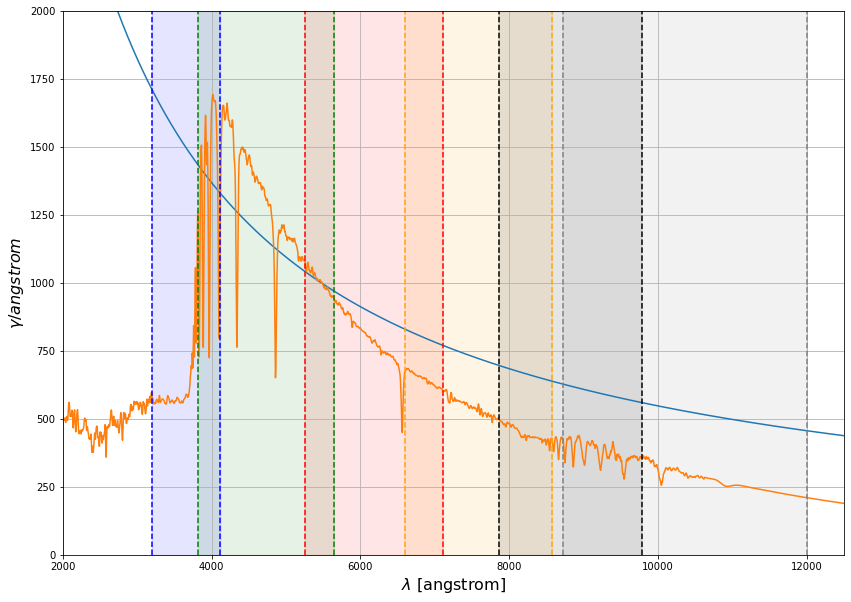

In [70]:
print(flatsp.fluxunits)
flatsp.convert('photlam')
example_spec.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux)
plt.plot(example_spec.wave,example_spec.flux)

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*2000.,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*2000.,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*2000.,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*2000.,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*2000.,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*2000.,color=filter_colors[5],alpha=0.1)

plt.xlim(2000.,12500.)
plt.ylim(0.,2000.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$',fontsize=16)

In [71]:
for filter in lsst_bp:
    myAB(example_spec,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.59e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7222408197036627
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.09224087927554477
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not 

In [72]:
for fi,filter in enumerate(filters):
    myAB(example_spec,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.01e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2175744456051412
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.38e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1171906588860904
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

# Calculate magnitudes and colours

We compute the magnitudes for the spectra of each spectral type for each atmosphere 

In [73]:
calc_mag_err = True

In [74]:
# Magnitudes of spectra passing through atm x throughput 
mag_dict = {}
mag_dict_ref = {}
mag_err_dict = {}
mag_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    mag_dict_st = {}
    mag_dict_ref_st = {}
    mag_err_dict_st = {}
    mag_err_dict_ref_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        mag_dict_ = {}
        mag_dict_ref_ = {}
        mag_err_dict_ = {}
        mag_err_dict_ref_ = {}
        for fi,filter in enumerate(filters):
            mag_dict_[filter] = []
            mag_err_dict_[filter] = []
            for i in range(n_sim):
                #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
                if calc_mag_err:
                    mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True)
                    mag_err_dict_[filter].append(mag_ab_err_)
                else:
                    mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
                mag_dict_[filter].append(mag_ab_)
                
            #mag_dict[sed_] = mag_dict_
            
            if calc_mag_err:
                mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True)
                mag_err_dict_ref_[filter] = mag_ab_err_
            else:
                mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
            mag_dict_ref_[filter] = mag_ab_
        mag_dict_st[si] = mag_dict_
        mag_dict_ref_st[si] = mag_dict_ref_
        mag_err_dict_st[si] = mag_err_dict_
        mag_err_dict_ref_st[si] = mag_err_dict_ref_
    mag_dict[st] = mag_dict_st
    mag_dict_ref[st] = mag_dict_ref_st
    mag_err_dict[st] = mag_err_dict_st
    mag_err_dict_ref[st] = mag_err_dict_ref_st
        

O
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.85e+12
Numerator = 3.85e+12
Variance of the numerator = 6.98e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.23843688103099198
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.78e+12
Numerator = 3.78e+12
Variance of the numerator = 6.75

n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.57e+12
Numerator = 8.57e+12
Variance of the numerator = 3.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.04532626786880219
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.46e+12
Numerator = 8.46e+12
Variance of the numerator = 2.99e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03121509276

((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.36e+12
Numerator = 2.36e+12
Variance of the numerator = 1.05e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.7131098486224163
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.34e+12
Numerator = 2.34e+12
Variance of the numerator = 1.04e+12
(i) does not have a defined binset in t

n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.24e+12
Numerator = 1.24e+12
Variance of the numerator = 5.19e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.9909827655575886
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.31e+11
Numerator = 5.31e+11
Variance of the numerator = 1.19e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.22977612942281

Numerator = 3.33e+12
Variance of the numerator = 5.67e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.08065935883435205
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.27e+12
Numerator = 3.27e+12
Variance of the numerator = 5.49e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.06302798424629301
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of th

Denominator = 8.22e+12
AB magnitude =  0.031901620635281354
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.52e+12
Numerator = 8.52e+12
Variance of the numerator = 3.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03839526394080968
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectr

Number of collected photoelectrons = 2.34e+12
Numerator = 2.34e+12
Variance of the numerator = 1.03e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.7245363428014961
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.32e+12
Numerator = 2.32e+12
Variance of the numerator = 1.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.7321125601489451
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined bins

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.14e+11
Numerator = 5.14e+11
Variance of the numerator = 1.15e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.2653912068771218
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.11e+11
Numerator = 5.11e+11
Variance of the numerator = 1.13e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.27045568671801

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 3.25e+12
Numerator = 3.25e+12
Variance of the numerator = 5.34e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.055541435736287594
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 3.20e+12
Numerator = 3.20e+12
Variance of the numerator = 5.17e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.0380102364

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 4.35e+12
Numerator = 4.35e+12
Variance of the numerator = 1.86e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3780625510366467
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 4.31e+12
Numerator = 4.31e+12
Variance of the numerator = 1.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.38793214447010

Denominator = 4.55e+12
AB magnitude =  0.7541766794123848
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 2.26e+12
Numerator = 2.26e+12
Variance of the numerator = 9.57e+11
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.7620484884975007
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons 

((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 5.19e+11
Numerator = 5.19e+11
Variance of the numerator = 1.14e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.2540599803813224
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 5.17e+11
Numerator = 5.17e+11
Variance of the numerator = 1.13e+11
(Y) does not have a defined binset in t

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.21e+12
Numerator = 3.21e+12
Variance of the numerator = 5.54e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.04026469250772674
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.83e+12
Numerator = 8.83e+12
Variance of the numerator = 3.34e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.07779720338

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.22e+12
Numerator = 4.22e+12
Variance of the numerator = 1.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.40976635085474067
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.19e+12
Numerator = 4.19e+12
Variance of the numerator = 1.72e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.4198021557361

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.30e+12
Numerator = 1.30e+12
Variance of the numerator = 5.41e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.9384434749123864
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.29e+12
Numerator = 1.29e+12
Variance of the numerator = 5.35e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.94488439255309

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 2.84e+12
Numerator = 2.84e+12
Variance of the numerator = 5.15e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.09026752778985318
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 2.80e+12
Numerator = 2.80e+12
Variance of the numerator = 4.99e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1080150505812

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 7.93e+12
Numerator = 7.93e+12
Variance of the numerator = 2.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.03850199443719456
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 7.83e+12
Numerator = 7.83e+12
Variance of the numerator = 2.79e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0525379724858

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 4.43e+12
Numerator = 4.43e+12
Variance of the numerator = 1.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.35785763326966263
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 2.56e+12
Numerator = 2.56e+12
Variance of the numerator = 1.14e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6246733527965

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 1.44e+12
Numerator = 1.44e+12
Variance of the numerator = 6.03e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8251760924886651
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 1.43e+12
Numerator = 1.43e+12
Variance of the numerator = 5.96e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.83161420899650

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.23e+12
Numerator = 2.23e+12
Variance of the numerator = 4.08e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.3522471624427772
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.20e+12
Numerator = 2.20e+12
Variance of the numerator = 3.95e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.36992014996642

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.80e+12
Numerator = 7.80e+12
Variance of the numerator = 2.82e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.05669600368784168
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.70e+12
Numerator = 7.70e+12
Variance of the numerator = 2.75e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0707050701618

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.26e+12
Numerator = 4.26e+12
Variance of the numerator = 1.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3993597462207033
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.46e+12
Numerator = 4.46e+12
Variance of the numerator = 1.89e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.34952603011217

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.55e+12
Numerator = 1.55e+12
Variance of the numerator = 6.45e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7495449288501478
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.54e+12
Numerator = 1.54e+12
Variance of the numerator = 6.37e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.75598372284367

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 1.70e+12
Numerator = 1.70e+12
Variance of the numerator = 3.12e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.6466483503935428
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 1.68e+12
Numerator = 1.68e+12
Variance of the numerator = 3.03e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.66424422551185

((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 7.47e+12
Numerator = 7.47e+12
Variance of the numerator = 2.67e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.10391498364694982
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 7.37e+12
Numerator = 7.37e+12
Variance of the numerator = 2.60e+12
(g) does not have a defined binset in 

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 2.85e+12
Numerator = 2.85e+12
Variance of the numerator = 1.25e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5067022075233134
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 2.83e+12
Numerator = 2.84e+12
Variance of the numerator = 1.23e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.51425968573944

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 1.65e+12
Numerator = 1.65e+12
Variance of the numerator = 6.76e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.6797087777243203
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 1.64e+12
Numerator = 1.64e+12
Variance of the numerator = 6.68e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.68630672419668

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.39e+12
Numerator = 1.39e+12
Variance of the numerator = 2.52e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.8647459133793778
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.37e+12
Numerator = 1.37e+12
Variance of the numerator = 2.44e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.88227674108689

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 7.13e+12
Numerator = 7.13e+12
Variance of the numerator = 2.48e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.15458198841826157
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 7.04e+12
Numerator = 7.04e+12
Variance of the numerator = 2.42e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1685257301290

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 2.96e+12
Numerator = 2.96e+12
Variance of the numerator = 1.31e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4669241927120408
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 2.94e+12
Numerator = 2.94e+12
Variance of the numerator = 1.29e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.47448530836520

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.80e+12
Numerator = 1.80e+12
Variance of the numerator = 7.57e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5825422213897616
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 8.29e+11
Numerator = 8.29e+11
Variance of the numerator = 1.84e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.74633886511390

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.19e+12
Numerator = 1.19e+12
Variance of the numerator = 2.09e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0355357816331376
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.02e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.05305520961160

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 4.83e+12
Numerator = 4.83e+12
Variance of the numerator = 2.07e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.263900701227405
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 4.79e+12
Numerator = 4.79e+12
Variance of the numerator = 2.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.273729452351762

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 2.91e+12
Numerator = 2.91e+12
Variance of the numerator = 1.24e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.48509969060963765
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 2.89e+12
Numerator = 2.89e+12
Variance of the numerator = 1.23e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4929548583660

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 8.18e+11
Numerator = 8.18e+11
Variance of the numerator = 1.79e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7610347264628626
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 8.14e+11
Numerator = 8.14e+11
Variance of the numerator = 1.77e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.76633821078713

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 2.72e+12
Numerator = 2.72e+12
Variance of the numerator = 4.68e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1378863962756505
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 8.73e+12
Numerator = 8.73e+12
Variance of the numerator = 3.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.0659742241666

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 4.28e+12
Numerator = 4.28e+12
Variance of the numerator = 1.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3951583226980255
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 4.24e+12
Numerator = 4.24e+12
Variance of the numerator = 1.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.40518621465135

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 1.44e+12
Numerator = 1.44e+12
Variance of the numerator = 6.13e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8249038455523717
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 1.43e+12
Numerator = 1.43e+12
Variance of the numerator = 6.06e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.83113668207327

Number of collected photoelectrons = 5.99e+11
Numerator = 5.99e+11
Variance of the numerator = 1.32e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.0984927092890298
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.51e+12
Numerator = 1.51e+12
Variance of the numerator = 2.76e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7786023990007712
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined bins

Number of collected photoelectrons = 7.48e+12
Numerator = 7.48e+12
Variance of the numerator = 2.71e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.10172573375647552
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 7.39e+12
Numerator = 7.39e+12
Variance of the numerator = 2.65e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.11569901600229
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binse

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 2.88e+12
Numerator = 2.88e+12
Variance of the numerator = 1.26e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.49849615063344704
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 2.86e+12
Numerator = 2.86e+12
Variance of the numerator = 1.25e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5060627972463

(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.6329113918856298
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.71e+12
Numerator = 1.71e+12
Variance of the numerator = 6.98e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.6394984512553524
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.71e+12
Numerator = 2.71e+12
Variance of the numerator = 4.56e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.14215441081150176
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.67e+12
Numerator = 2.67e+12
Variance of the numerator = 4.42e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1596405929521

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 4.48e+12
Numerator = 4.48e+12
Variance of the numerator = 1.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3452286266660922
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 4.44e+12
Numerator = 4.44e+12
Variance of the numerator = 1.92e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.35508945159785

Numerator = 2.41e+12
Variance of the numerator = 1.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6916928899982967
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.50e+12
Numerator = 2.50e+12
Variance of the numerator = 1.09e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6528161734323088
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the sp

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 5.80e+11
Numerator = 5.80e+11
Variance of the numerator = 1.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.1335262962113213
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 5.77e+11
Numerator = 5.77e+11
Variance of the numerator = 1.27e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.13860162325433

Denominator = 8.22e+12
AB magnitude =  0.010722487101614043
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 8.03e+12
Numerator = 8.03e+12
Variance of the numerator = 2.98e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.024757258760751858
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectr

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 4.29e+12
Numerator = 4.29e+12
Variance of the numerator = 1.77e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.39404270254941526
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 4.25e+12
Numerator = 4.25e+12
Variance of the numerator = 1.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.4040586370552

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 1.54e+12
Numerator = 1.54e+12
Variance of the numerator = 6.44e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7508394831061971
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 1.53e+12
Numerator = 1.53e+12
Variance of the numerator = 6.37e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.75727573063467

Denominator = 3.09e+12
AB magnitude =  0.5792985305911054
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 1.78e+12
Numerator = 1.78e+12
Variance of the numerator = 3.21e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5969333190808837
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons 

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.29e+12
Numerator = 7.29e+12
Variance of the numerator = 2.52e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.13005142602158534
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.78e+12
Numerator = 7.78e+12
Variance of the numerator = 2.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0601914151482

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 2.80e+12
Numerator = 2.80e+12
Variance of the numerator = 1.22e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5267462621465016
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 2.78e+12
Numerator = 2.78e+12
Variance of the numerator = 1.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.53447028840411

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.51e+11
Numerator = 7.51e+11
Variance of the numerator = 1.67e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.8525125730033544
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.48e+11
Numerator = 7.48e+11
Variance of the numerator = 1.66e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.85757448218338

Denominator = 3.09e+12
AB magnitude =  1.1217270062992195
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.08e+12
Numerator = 1.08e+12
Variance of the numerator = 1.75e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.1389843608940695
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons 

Denominator = 6.16e+12
AB magnitude =  0.29920455053711104
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 4.63e+12
Numerator = 4.63e+12
Variance of the numerator = 1.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3091352635223478
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.80e+12
Numerator = 1.80e+12
Variance of the numerator = 7.59e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5843063296982041
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.79e+12
Numerator = 1.79e+12
Variance of the numerator = 7.51e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.59052370671029

Denominator = 1.65e+12
AB magnitude =  0.7525460026071309
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 8.45e+11
Numerator = 8.45e+11
Variance of the numerator = 1.85e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7257237818545847
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons 

((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 7.49e+12
Numerator = 7.49e+12
Variance of the numerator = 2.64e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.10157942101953876
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 7.39e+12
Numerator = 7.39e+12
Variance of the numerator = 2.58e+12
(g) does not have a defined binset in 

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 2.59e+12
Numerator = 2.59e+12
Variance of the numerator = 1.14e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6143694853641375
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 2.57e+12
Numerator = 2.57e+12
Variance of the numerator = 1.12e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.62193855378803

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 1.43e+12
Numerator = 1.43e+12
Variance of the numerator = 5.82e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8367379597463818
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 1.47e+12
Numerator = 1.47e+12
Variance of the numerator = 6.18e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.80427943037872

Denominator = 3.09e+12
AB magnitude =  0.5513854070748608
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 1.83e+12
Numerator = 1.83e+12
Variance of the numerator = 3.05e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5688092558627025
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons 

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 4.68e+12
Numerator = 4.68e+12
Variance of the numerator = 2.00e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.29832088358679193
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 4.64e+12
Numerator = 4.64e+12
Variance of the numerator = 1.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3081627429571

Number of collected photoelectrons = 2.74e+12
Numerator = 2.74e+12
Variance of the numerator = 1.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5504848040260486
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 1.60e+12
Numerator = 1.60e+12
Variance of the numerator = 6.85e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.711090462452596
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binse

((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 6.72e+11
Numerator = 6.72e+11
Variance of the numerator = 1.45e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9732052278806692
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 6.69e+11
Numerator = 6.69e+11
Variance of the numerator = 1.44e+11
(Y) does not have a defined binset in t

Denominator = 8.22e+12
AB magnitude =  0.02022012495426759
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 7.96e+12
Numerator = 7.96e+12
Variance of the numerator = 2.91e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.034256541338695136
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectro

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 4.37e+12
Numerator = 4.37e+12
Variance of the numerator = 1.85e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.37344153307307604
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.62e+12
Numerator = 2.62e+12
Variance of the numerator = 1.17e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5981458146548

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 1.40e+12
Numerator = 1.40e+12
Variance of the numerator = 5.73e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8586106979675203
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 1.39e+12
Numerator = 1.39e+12
Variance of the numerator = 5.66e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.86521130630873

((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.59e+12
Numerator = 2.59e+12
Variance of the numerator = 4.43e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.19178673843858765
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.55e+12
Numerator = 2.55e+12
Variance of the numerator = 4.29e+11
(u) does not have a defined binset in 

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.66e+12
Numerator = 4.66e+12
Variance of the numerator = 2.02e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.30238193622870385
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.62e+12
Numerator = 4.62e+12
Variance of the numerator = 1.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3122043742725

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.67e+12
Numerator = 2.67e+12
Variance of the numerator = 1.13e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5778508023949783
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.65e+12
Numerator = 2.65e+12
Variance of the numerator = 1.12e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.58571973004691

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.21e+11
Numerator = 6.21e+11
Variance of the numerator = 1.36e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.059828046798104
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.18e+11
Numerator = 6.18e+11
Variance of the numerator = 1.34e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.065136606091762

((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 7.78e+12
Numerator = 7.78e+12
Variance of the numerator = 2.92e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.06037077521586439
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 7.68e+12
Numerator = 7.68e+12
Variance of the numerator = 2.84e+12
(g) does not have a defined binset in 

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 4.67e+12
Numerator = 4.67e+12
Variance of the numerator = 1.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3005975186804989
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 2.85e+12
Numerator = 2.85e+12
Variance of the numerator = 1.27e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.50905524122772

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 1.57e+12
Numerator = 1.57e+12
Variance of the numerator = 6.49e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.735407101436375
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 1.56e+12
Numerator = 1.56e+12
Variance of the numerator = 6.42e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.742006697236793

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 1.92e+12
Numerator = 1.92e+12
Variance of the numerator = 3.32e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5150363951953925
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 1.89e+12
Numerator = 1.89e+12
Variance of the numerator = 3.22e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.53257417477158

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 4.81e+12
Numerator = 4.81e+12
Variance of the numerator = 2.08e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.26795946966254947
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 4.77e+12
Numerator = 4.77e+12
Variance of the numerator = 2.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2777729850500

Denominator = 4.55e+12
AB magnitude =  0.432482069152469
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 1.90e+12
Numerator = 1.90e+12
Variance of the numerator = 8.13e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.524771205498006
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 8.00e+11
Numerator = 8.00e+11
Variance of the numerator = 1.73e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7840742100050248
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 7.96e+11
Numerator = 7.96e+11
Variance of the numerator = 1.72e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.78957099864607

Number of collected photoelectrons = 7.18e+12
Numerator = 7.18e+12
Variance of the numerator = 2.68e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.14713837815351855
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.09e+12
Numerator = 7.09e+12
Variance of the numerator = 2.61e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1610522558460026
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined bin

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.73e+12
Numerator = 4.73e+12
Variance of the numerator = 2.01e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.286025306909165
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.17e+12
Numerator = 3.17e+12
Variance of the numerator = 1.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.393704059347367

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.95e+12
Numerator = 1.95e+12
Variance of the numerator = 8.07e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4959287829554987
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.94e+12
Numerator = 1.94e+12
Variance of the numerator = 7.97e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.50251799662511

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 9.43e+11
Numerator = 9.43e+11
Variance of the numerator = 1.62e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2875396564326478
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 9.28e+11
Numerator = 9.28e+11
Variance of the numerator = 1.57e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.30489872805074

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 4.82e+12
Numerator = 4.82e+12
Variance of the numerator = 2.06e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2670184157487852
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 4.77e+12
Numerator = 4.77e+12
Variance of the numerator = 2.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.27684805956020

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 1.93e+12
Numerator = 1.93e+12
Variance of the numerator = 8.23e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5106778041764196
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 1.91e+12
Numerator = 1.91e+12
Variance of the numerator = 8.13e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.51689714989669

Denominator = 1.65e+12
AB magnitude =  0.6993341572120353
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 8.61e+11
Numerator = 8.61e+11
Variance of the numerator = 1.84e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7048244897379964
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons 

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.94e+12
Numerator = 6.94e+12
Variance of the numerator = 2.53e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1841256128219426
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.85e+12
Numerator = 6.85e+12
Variance of the numerator = 2.47e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.19801987647926

Denominator = 4.55e+12
AB magnitude =  0.36598099994891053
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.23e+12
Numerator = 3.23e+12
Variance of the numerator = 1.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3735356922353267
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.94e+12
Numerator = 1.94e+12
Variance of the numerator = 7.97e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5009544792450759
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.93e+12
Numerator = 1.93e+12
Variance of the numerator = 7.88e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.50754357252189

Denominator = 3.09e+12
AB magnitude =  1.3945316329440105
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.41e+11
Numerator = 8.41e+11
Variance of the numerator = 1.42e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.4118794263585057
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons 

Denominator = 6.16e+12
AB magnitude =  0.20608756763057054
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.05e+12
Numerator = 5.05e+12
Variance of the numerator = 2.18e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.21590449584791843
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectron

Denominator = 4.55e+12
AB magnitude =  0.3820899962902695
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.32e+12
Numerator = 3.32e+12
Variance of the numerator = 1.45e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.343280554188263
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons =

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.37e+11
Numerator = 9.37e+11
Variance of the numerator = 2.02e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6133525469302294
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.32e+11
Numerator = 9.32e+11
Variance of the numerator = 2.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.61883763854836

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 6.53e+12
Numerator = 6.53e+12
Variance of the numerator = 2.42e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.24964621804484705
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 6.45e+12
Numerator = 6.45e+12
Variance of the numerator = 2.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2634932213722

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 3.55e+12
Numerator = 3.55e+12
Variance of the numerator = 1.58e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.27102480374606397
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 3.52e+12
Numerator = 3.52e+12
Variance of the numerator = 1.56e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.2785738389236

Denominator = 3.08e+12
AB magnitude =  0.3789419348806012
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 2.24e+12
Numerator = 2.24e+12
Variance of the numerator = 9.40e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.34655049300067103
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons

((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 7.29e+11
Numerator = 7.29e+11
Variance of the numerator = 1.24e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.5668704827364484
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 7.18e+11
Numerator = 7.18e+11
Variance of the numerator = 1.20e+11
(u) does not have a defined binset in t

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 5.27e+12
Numerator = 5.27e+12
Variance of the numerator = 2.27e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.16862184513087408
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 5.23e+12
Numerator = 5.23e+12
Variance of the numerator = 2.23e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1784165029990

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 3.59e+12
Numerator = 3.59e+12
Variance of the numerator = 1.51e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.25765442116759063
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 3.72e+12
Numerator = 3.72e+12
Variance of the numerator = 1.62e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.2188744752034

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.49e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.3729957883814947
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 1.20e+12
Numerator = 1.20e+12
Variance of the numerator = 2.61e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.34620180769517

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 7.24e+12
Numerator = 7.24e+12
Variance of the numerator = 2.63e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.13809306120199188
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 7.15e+12
Numerator = 7.15e+12
Variance of the numerator = 2.57e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1520341857552

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 3.03e+12
Numerator = 3.03e+12
Variance of the numerator = 1.31e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4410574810240367
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 3.01e+12
Numerator = 3.01e+12
Variance of the numerator = 1.30e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.44878190556601

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 8.96e+11
Numerator = 8.96e+11
Variance of the numerator = 2.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6611086110637919
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 8.92e+11
Numerator = 8.92e+11
Variance of the numerator = 1.98e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.66617049134000

((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 8.53e+11
Numerator = 8.53e+11
Variance of the numerator = 1.51e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.3965269789082653
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 7.16e+12
Numerator = 7.16e+12
Variance of the numerator = 2.76e+12
(g) does not have a defined binset in t

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 4.86e+12
Numerator = 4.86e+12
Variance of the numerator = 2.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2580559846564798
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 4.81e+12
Numerator = 4.81e+12
Variance of the numerator = 1.99e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.26804110102383

Denominator = 3.08e+12
AB magnitude =  0.41350550906624367
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 2.09e+12
Numerator = 2.09e+12
Variance of the numerator = 8.79e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.41972164801447387
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectron

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 1.00e+12
Numerator = 1.00e+12
Variance of the numerator = 1.83e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2231129207659812
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 9.85e+11
Numerator = 9.85e+11
Variance of the numerator = 1.78e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.24061534446528

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 6.75e+12
Numerator = 6.75e+12
Variance of the numerator = 2.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.21462568047260672
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 6.66e+12
Numerator = 6.66e+12
Variance of the numerator = 2.34e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2284906540057

((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 3.06e+12
Numerator = 3.06e+12
Variance of the numerator = 1.33e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4296817753413751
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 3.04e+12
Numerator = 3.04e+12
Variance of the numerator = 1.31e+12
(i) does not have a defined binset in t

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 9.10e+11
Numerator = 9.10e+11
Variance of the numerator = 2.03e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.644651657976852
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 9.06e+11
Numerator = 9.06e+11
Variance of the numerator = 2.01e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.649710483250667

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.43e+11
Numerator = 7.43e+11
Variance of the numerator = 1.21e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.5463296206254804
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.05e+11
Numerator = 8.05e+11
Variance of the numerator = 1.41e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.45991317772468

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.91e+12
Numerator = 4.91e+12
Variance of the numerator = 2.05e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.24579009832592125
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.87e+12
Numerator = 4.87e+12
Variance of the numerator = 2.01e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2557732532728

Denominator = 3.08e+12
AB magnitude =  0.44039192913132263
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.04e+12
Numerator = 2.04e+12
Variance of the numerator = 8.57e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.44661001944074785
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectron

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.68e+11
Numerator = 9.68e+11
Variance of the numerator = 2.12e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5780271337303957
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 8.05e+11
Numerator = 8.05e+11
Variance of the numerator = 1.49e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.45919368709532

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 6.08e+12
Numerator = 6.08e+12
Variance of the numerator = 2.12e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.32685829384049075
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 6.48e+12
Numerator = 6.48e+12
Variance of the numerator = 2.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2578520263300

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 3.48e+12
Numerator = 3.48e+12
Variance of the numerator = 1.50e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.29221190223151366
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 3.45e+12
Numerator = 3.45e+12
Variance of the numerator = 1.48e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3000644112313

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 1.09e+12
Numerator = 1.09e+12
Variance of the numerator = 2.38e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.44876079717860334
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 1.08e+12
Numerator = 1.08e+12
Variance of the numerator = 2.36e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.4540624907561

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.58e+12
Numerator = 6.58e+12
Variance of the numerator = 2.54e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.24114395048476073
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.50e+12
Numerator = 6.50e+12
Variance of the numerator = 2.47e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2549726692686

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.03e+12
Numerator = 5.03e+12
Variance of the numerator = 2.05e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2190912392776653
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.27e+12
Numerator = 5.27e+12
Variance of the numerator = 2.24e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.16952628899506

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.43e+12
Numerator = 2.43e+12
Variance of the numerator = 1.01e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.25684214406763944
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.42e+12
Numerator = 2.42e+12
Variance of the numerator = 9.96e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.2634280365140

((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 1.22e+12
Numerator = 1.22e+12
Variance of the numerator = 2.17e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0050950039875484
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 1.20e+12
Numerator = 1.20e+12
Variance of the numerator = 2.10e+11
(u) does not have a defined binset in t

((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 4.97e+12
Numerator = 4.97e+12
Variance of the numerator = 2.15e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.23261240550668383
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 4.93e+12
Numerator = 4.93e+12
Variance of the numerator = 2.11e+12
(r) does not have a defined binset in 

n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 3.14e+12
Numerator = 3.14e+12
Variance of the numerator = 1.33e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.40264996479820403
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 3.12e+12
Numerator = 3.12e+12
Variance of the numerator = 1.31e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4104988646097

n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 9.51e+11
Numerator = 9.51e+11
Variance of the numerator = 2.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5968725998525564
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 9.46e+11
Numerator = 9.46e+11
Variance of the numerator = 2.05e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.60217480674338

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 6.74e+12
Numerator = 6.74e+12
Variance of the numerator = 2.52e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.21581994370614951
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 6.65e+12
Numerator = 6.65e+12
Variance of the numerator = 2.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2296884398511

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 3.47e+12
Numerator = 3.47e+12
Variance of the numerator = 1.55e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.29532491500314856
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 3.44e+12
Numerator = 3.44e+12
Variance of the numerator = 1.53e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3028830287650

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 2.11e+12
Numerator = 2.11e+12
Variance of the numerator = 8.60e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.41348259432447304
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 2.17e+12
Numerator = 2.17e+12
Variance of the numerator = 9.13e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3810751350316

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 6.87e+11
Numerator = 6.87e+11
Variance of the numerator = 1.17e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6325144827848317
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 6.76e+11
Numerator = 6.76e+11
Variance of the numerator = 1.13e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.64981853393829

Number of collected photoelectrons = 5.53e+12
Numerator = 5.53e+12
Variance of the numerator = 2.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.11642040916480387
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 5.48e+12
Numerator = 5.48e+12
Variance of the numerator = 2.34e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.12619153119566412
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined bi

Denominator = 4.55e+12
AB magnitude =  0.09536458752985387
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 2.76e+12
Numerator = 2.76e+12
Variance of the numerator = 1.18e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.12100966553033858
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectron

((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 1.27e+12
Numerator = 1.27e+12
Variance of the numerator = 2.72e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.27911444731501067
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 1.27e+12
Numerator = 1.27e+12
Variance of the numerator = 2.69e+11
(Y) does not have a defined binset in 

((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.59e+12
Numerator = 5.59e+12
Variance of the numerator = 2.03e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4186738917987397
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.52e+12
Numerator = 5.52e+12
Variance of the numerator = 1.98e+12
(g) does not have a defined binset in t

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.49e+12
Numerator = 4.49e+12
Variance of the numerator = 1.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.014076850673306229
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.46e+12
Numerator = 4.46e+12
Variance of the numerator = 1.96e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.021612547435

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.52e+12
Numerator = 1.52e+12
Variance of the numerator = 3.37e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.08667899465962879
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.51e+12
Numerator = 1.51e+12
Variance of the numerator = 3.34e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.0917287437977

AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.736885566773792
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.14e+11
Numerator = 6.14e+11
Variance of the numerator = 1.02e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.754244142724397
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of

AB magnitude =  0.0813992213757733
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.66e+12
Numerator = 5.66e+12
Variance of the numerator = 2.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.09124654972364385
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.61e+12
Numerator =

Denominator = 3.08e+12
AB magnitude =  -0.04034615405539531
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.18e+12
Numerator = 3.18e+12
Variance of the numerator = 1.34e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.03412529689868508
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectr

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.55e+12
Numerator = 1.55e+12
Variance of the numerator = 3.37e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.0693695381593371
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 7.37e+11
Numerator = 7.37e+11
Variance of the numerator = 1.38e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.55500826980807

Denominator = 8.22e+12
AB magnitude =  0.4539211173414531
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 5.34e+12
Numerator = 5.34e+12
Variance of the numerator = 1.92e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4675589970107397
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons 

n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 4.64e+12
Numerator = 4.64e+12
Variance of the numerator = 2.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.02033222951774613
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 4.61e+12
Numerator = 4.61e+12
Variance of the numerator = 2.00e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.01279746307

Denominator = 3.08e+12
AB magnitude =  -0.02628890377910859
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 1.52e+12
Numerator = 1.52e+12
Variance of the numerator = 3.36e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.08695629288802498
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectro

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.75e+11
Numerator = 5.75e+11
Variance of the numerator = 9.39e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.8243976235514447
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.23e+11
Numerator = 6.23e+11
Variance of the numerator = 1.10e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.73725760359933

Denominator = 6.16e+12
AB magnitude =  0.061915787386296786
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.77e+12
Numerator = 5.77e+12
Variance of the numerator = 2.42e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.07175522807523863
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectro

Denominator = 3.08e+12
AB magnitude =  -0.10419421139703777
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.37e+12
Numerator = 3.37e+12
Variance of the numerator = 1.42e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.09797596517290057
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectr

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.65e+12
Numerator = 1.65e+12
Variance of the numerator = 3.60e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.0011768834149068841
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 6.05e+11
Numerator = 6.05e+11
Variance of the numerator = 1.13e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.7694596597

Number of collected photoelectrons = 5.19e+12
Numerator = 5.19e+12
Variance of the numerator = 1.87e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4984015556181326
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 5.13e+12
Numerator = 5.13e+12
Variance of the numerator = 1.83e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5120001301330518
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined bins

n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 5.02e+12
Numerator = 5.02e+12
Variance of the numerator = 2.19e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.10567347456001575
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 4.98e+12
Numerator = 4.98e+12
Variance of the numerator = 2.16e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.09814175107

AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.11173254781526033
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 1.82e+12
Numerator = 1.82e+12
Variance of the numerator = 3.95e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.10669793407252187
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Num

n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.12e+11
Numerator = 5.12e+11
Variance of the numerator = 8.38e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9513299811822837
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.55e+11
Numerator = 5.55e+11
Variance of the numerator = 9.84e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.86421303885904

n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.87e+12
Numerator = 5.87e+12
Variance of the numerator = 2.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.052578369383192845
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.82e+12
Numerator = 5.82e+12
Variance of the numerator = 2.40e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.062482056111

((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.63e+12
Numerator = 3.63e+12
Variance of the numerator = 1.52e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.17885850553722066
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.61e+12
Numerator = 3.61e+12
Variance of the numerator = 1.51e+12
(z) does not have a defined binset in

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 6.04e+11
Numerator = 6.04e+11
Variance of the numerator = 1.09e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.771740908339885
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.94e+11
Numerator = 5.94e+11
Variance of the numerator = 1.05e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.789343511313253

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.13e+12
Numerator = 5.13e+12
Variance of the numerator = 1.82e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5127577231744628
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.06e+12
Numerator = 5.06e+12
Variance of the numerator = 1.78e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.52634619739960

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 4.86e+12
Numerator = 4.86e+12
Variance of the numerator = 2.06e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.07041763447325959
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 4.82e+12
Numerator = 4.82e+12
Variance of the numerator = 2.03e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.06259085884

Denominator = 1.65e+12
AB magnitude =  -0.024802544279636525
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 1.68e+12
Numerator = 1.68e+12
Variance of the numerator = 3.68e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.019753055595696768
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelec

Number of collected photoelectrons = 5.38e+12
Numerator = 5.38e+12
Variance of the numerator = 2.06e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4610618526687684
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.31e+12
Numerator = 5.31e+12
Variance of the numerator = 2.01e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.47466490061535815
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined bin

((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.95e+12
Numerator = 5.95e+12
Variance of the numerator = 2.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.038213729853350975
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.89e+12
Numerator = 5.89e+12
Variance of the numerator = 2.43e+12
(r) does not have a defined binset in

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 3.67e+12
Numerator = 3.67e+12
Variance of the numerator = 1.52e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.19068642386519374
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 3.65e+12
Numerator = 3.65e+12
Variance of the numerator = 1.51e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.18409392240

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 7.25e+11
Numerator = 7.25e+11
Variance of the numerator = 1.33e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.5732761155947415
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 7.14e+11
Numerator = 7.14e+11
Variance of the numerator = 1.29e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.59081578226776

Denominator = 6.16e+12
AB magnitude =  0.07733373804900913
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 5.69e+12
Numerator = 5.69e+12
Variance of the numerator = 2.47e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.08709869809720178
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectron

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 4.20e+12
Numerator = 4.20e+12
Variance of the numerator = 1.79e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.0885018009483831
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 4.17e+12
Numerator = 4.17e+12
Variance of the numerator = 1.77e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.09633589566307

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 1.36e+12
Numerator = 1.36e+12
Variance of the numerator = 2.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.21220648317285315
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 1.35e+12
Numerator = 1.35e+12
Variance of the numerator = 2.91e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.2176981858419

((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.87e+12
Numerator = 5.87e+12
Variance of the numerator = 2.24e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.36553470058784615
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.80e+12
Numerator = 5.80e+12
Variance of the numerator = 2.19e+12
(g) does not have a defined binset in 

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.72e+12
Numerator = 4.72e+12
Variance of the numerator = 2.10e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.03825722636025307
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.68e+12
Numerator = 4.68e+12
Variance of the numerator = 2.07e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.03072307194

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.08e+12
Numerator = 3.08e+12
Variance of the numerator = 1.27e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.0012423822161131406
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.06e+12
Numerator = 3.06e+12
Variance of the numerator = 1.25e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.00783125635

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.99e+11
Numerator = 4.99e+11
Variance of the numerator = 8.37e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9799227313046912
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.91e+11
Numerator = 4.91e+11
Variance of the numerator = 8.11e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.99729445497888

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.04e+12
Numerator = 6.04e+12
Variance of the numerator = 2.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.021720135353285874
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.98e+12
Numerator = 5.98e+12
Variance of the numerator = 2.58e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.031459685776

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.50e+12
Numerator = 3.50e+12
Variance of the numerator = 1.49e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.13927837869103976
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.48e+12
Numerator = 3.48e+12
Variance of the numerator = 1.47e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.13306133056

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.68e+12
Numerator = 1.68e+12
Variance of the numerator = 3.59e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.020205671248191892
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.67e+12
Numerator = 1.67e+12
Variance of the numerator = 3.55e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.0147242275

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 5.85e+12
Numerator = 5.85e+12
Variance of the numerator = 2.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3692699818757505
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 5.78e+12
Numerator = 5.78e+12
Variance of the numerator = 2.02e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.38300045703836

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 3.93e+12
Numerator = 3.93e+12
Variance of the numerator = 1.72e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.15978820724658643
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 3.90e+12
Numerator = 3.90e+12
Variance of the numerator = 1.69e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.1673280164145

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 1.34e+12
Numerator = 1.34e+12
Variance of the numerator = 2.97e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.2232535333870509
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 1.34e+12
Numerator = 1.34e+12
Variance of the numerator = 2.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.22831041915977

((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 6.06e+11
Numerator = 6.06e+11
Variance of the numerator = 1.01e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.7682334473173558
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 5.96e+11
Numerator = 5.96e+11
Variance of the numerator = 9.83e+10
(u) does not have a defined binset in t

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 5.64e+12
Numerator = 5.64e+12
Variance of the numerator = 2.36e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.09599110710916578
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 5.59e+12
Numerator = 5.59e+12
Variance of the numerator = 2.32e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1059163938773

Denominator = 3.08e+12
AB magnitude =  0.008700658185852889
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 3.04e+12
Numerator = 3.04e+12
Variance of the numerator = 1.28e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.014915770735060545
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectr

Numerator = 1.50e+12
Variance of the numerator = 3.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.10113538570438224
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 6.52e+11
Numerator = 6.52e+11
Variance of the numerator = 1.22e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6892432926670313
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the s

((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 5.37e+12
Numerator = 5.37e+12
Variance of the numerator = 1.90e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4631348239627569
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 5.30e+12
Numerator = 5.30e+12
Variance of the numerator = 1.86e+12
(g) does not have a defined binset in t

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 4.61e+12
Numerator = 4.61e+12
Variance of the numerator = 2.00e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.0139220558581693
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 4.58e+12
Numerator = 4.58e+12
Variance of the numerator = 1.97e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.006220848543

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 1.63e+12
Numerator = 1.63e+12
Variance of the numerator = 3.57e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.009781247098488956
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 1.63e+12
Numerator = 1.63e+12
Variance of the numerator = 3.54e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.014826500573

((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 6.81e+12
Numerator = 6.81e+12
Variance of the numerator = 2.62e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2049288437523582
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.55e+12
(g) does not have a defined binset in t

((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 4.97e+12
Numerator = 4.97e+12
Variance of the numerator = 2.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.23418340271614385
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 4.92e+12
Numerator = 4.92e+12
Variance of the numerator = 2.00e+12
(r) does not have a defined binset in 

((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 2.31e+12
Numerator = 2.31e+12
Variance of the numerator = 9.62e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3142267788921582
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 2.29e+12
Numerator = 2.29e+12
Variance of the numerator = 9.51e+11
(z) does not have a defined binset in t

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 6.26e+11
Numerator = 6.26e+11
Variance of the numerator = 1.16e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.732746395226458
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 6.16e+11
Numerator = 6.16e+11
Variance of the numerator = 1.12e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.750190272465104

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 5.54e+12
Numerator = 5.54e+12
Variance of the numerator = 1.94e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4273894181793642
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 5.91e+12
Numerator = 5.91e+12
Variance of the numerator = 2.20e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.35883476753011

((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 4.01e+12
Numerator = 4.01e+12
Variance of the numerator = 1.71e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.1383053388953397
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 3.98e+12
Numerator = 3.98e+12
Variance of the numerator = 1.69e+12
(i) does not have a defined binset in t

((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 1.39e+12
Numerator = 1.39e+12
Variance of the numerator = 3.03e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.18567182323846018
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 1.38e+12
Numerator = 1.38e+12
Variance of the numerator = 3.00e+11
(Y) does not have a defined binset in 

((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.54e+12
Numerator = 6.54e+12
Variance of the numerator = 2.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.24766408479450355
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.46e+12
Numerator = 6.46e+12
Variance of the numerator = 2.43e+12
(g) does not have a defined binset in 

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.08e+12
Numerator = 5.08e+12
Variance of the numerator = 2.08e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2100003355240944
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.03e+12
Numerator = 5.03e+12
Variance of the numerator = 2.05e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.21995136883313

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.70e+12
Numerator = 2.70e+12
Variance of the numerator = 1.14e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.14210094089122766
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.69e+12
Numerator = 2.69e+12
Variance of the numerator = 1.12e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.1483105489079

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.76e+11
Numerator = 6.76e+11
Variance of the numerator = 1.28e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6500534943694092
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.65e+11
Numerator = 6.65e+11
Variance of the numerator = 1.24e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.66745795653747

Denominator = 8.22e+12
AB magnitude =  0.37345483475223573
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.21e+12
Numerator = 6.21e+12
Variance of the numerator = 2.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.30473713161831584
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectron

Denominator = 4.55e+12
AB magnitude =  0.10502117177390849
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.10e+12
Numerator = 4.10e+12
Variance of the numerator = 1.75e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.11285741224469667
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectron

Denominator = 1.65e+12
AB magnitude =  0.15311537171899142
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.42e+12
Numerator = 1.42e+12
Variance of the numerator = 3.11e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.15816435757135572
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 3.94e+11
Numerator = 3.94e+11
Variance of the numerator = 7.21e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2360627202135634
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.45818203237165

((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 5.73e+12
Numerator = 5.73e+12
Variance of the numerator = 2.36e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.07848841069717831
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 5.68e+12
Numerator = 5.68e+12
Variance of the numerator = 2.32e+12
(r) does not have a defined binset in 

((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 3.17e+12
Numerator = 3.17e+12
Variance of the numerator = 1.32e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.0313236642094957
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 3.15e+12
Numerator = 3.15e+12
Variance of the numerator = 1.31e+12
(z) does not have a defined binset in 

Number of collected photoelectrons = 5.27e+11
Numerator = 5.27e+11
Variance of the numerator = 9.67e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9196567535867386
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.19e+11
Numerator = 5.19e+11
Variance of the numerator = 9.36e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9372536396284272
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined bins

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.94e+12
Numerator = 4.94e+12
Variance of the numerator = 1.74e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5536878133720453
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.25e+12
Numerator = 5.25e+12
Variance of the numerator = 1.97e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.48582286608093

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.22e+12
Numerator = 5.22e+12
Variance of the numerator = 2.25e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.14866443361621562
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.18e+12
Numerator = 5.18e+12
Variance of the numerator = 2.22e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.14084152655

Denominator = 1.65e+12
AB magnitude =  -0.1433466433775107
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.87e+12
Numerator = 1.87e+12
Variance of the numerator = 4.11e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.13829538798180135
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectro

---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.31e+11
Numerator = 5.31e+11
Variance of the numerator = 9.46e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.911687804373547
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.48e+12
Numerator = 5.48e+12
Variance of the numerator =

Numerator = 5.99e+12
Variance of the numerator = 2.51e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.03054800984305496
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.94e+12
Numerator = 5.94e+12
Variance of the numerator = 2.47e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.04044697643231072
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the 

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 3.77e+12
Numerator = 3.77e+12
Variance of the numerator = 1.58e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2191404886171267
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 3.75e+12
Numerator = 3.75e+12
Variance of the numerator = 1.56e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.212923571745

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 4.97e+11
Numerator = 4.97e+11
Variance of the numerator = 9.21e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9830653736682313
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 4.89e+11
Numerator = 4.89e+11
Variance of the numerator = 8.91e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.00067163293554

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 4.90e+12
Numerator = 4.90e+12
Variance of the numerator = 1.73e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5624790978920161
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 5.21e+12
Numerator = 5.21e+12
Variance of the numerator = 1.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.49468296507468

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 5.49e+12
Numerator = 5.49e+12
Variance of the numerator = 2.38e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.2033682094445864
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 5.45e+12
Numerator = 5.45e+12
Variance of the numerator = 2.35e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.195677728219

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 4.51e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.23994652266293684
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 2.05e+12
Numerator = 2.05e+12
Variance of the numerator = 4.47e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.23490250964

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 4.26e+11
Numerator = 4.26e+11
Variance of the numerator = 7.05e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.1507654667180915
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 4.19e+11
Numerator = 4.19e+11
Variance of the numerator = 6.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.16813346234940

Denominator = 6.16e+12
AB magnitude =  -0.004126186287370198
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 6.13e+12
Numerator = 6.13e+12
Variance of the numerator = 2.58e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.005690391529863131
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelect

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 4.05e+12
Numerator = 4.05e+12
Variance of the numerator = 1.73e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2971773068767038
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.71e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.290964114017

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 2.01e+12
Numerator = 2.01e+12
Variance of the numerator = 4.30e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.21311467948118124
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 2.00e+12
Numerator = 2.00e+12
Variance of the numerator = 4.25e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.20763729846

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.03e+12
Numerator = 5.03e+12
Variance of the numerator = 1.91e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5328732928319507
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.97e+12
Numerator = 4.97e+12
Variance of the numerator = 1.87e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.54640254290372

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.28e+12
Numerator = 6.28e+12
Variance of the numerator = 2.69e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.02069363483348097
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.70e+12
Numerator = 5.70e+12
Variance of the numerator = 2.54e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.24492605529

(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.29794066339137926
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.67e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2915194595288566
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n

Denominator = 3.09e+12
AB magnitude =  2.0220195578709186
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 4.72e+11
Numerator = 4.72e+11
Variance of the numerator = 8.33e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.039643269674641
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons =

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 4.72e+12
Numerator = 4.72e+12
Variance of the numerator = 1.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6027274998410448
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.02e+12
Numerator = 5.02e+12
Variance of the numerator = 1.88e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.53508549774004

((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.34e+12
Numerator = 5.34e+12
Variance of the numerator = 2.32e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.1735570873620872
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.30e+12
Numerator = 5.30e+12
Variance of the numerator = 2.28e+12
(i) does not have a defined binset in 

((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 1.91e+12
Numerator = 1.91e+12
Variance of the numerator = 4.24e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.16117221751726987
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 1.90e+12
Numerator = 1.90e+12
Variance of the numerator = 4.20e+11
(Y) does not have a defined binset in

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 3.63e+11
Numerator = 3.63e+11
Variance of the numerator = 6.07e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.3246201116811154
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 3.57e+11
Numerator = 3.57e+11
Variance of the numerator = 5.88e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.34199427382499

Denominator = 6.16e+12
AB magnitude =  -0.05784762048231441
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 6.44e+12
Numerator = 6.44e+12
Variance of the numerator = 2.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.048136118699081284
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelect

Number of collected photoelectrons = 5.58e+12
Numerator = 5.58e+12
Variance of the numerator = 2.44e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.22064408786248188
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 4.12e+12
Numerator = 4.12e+12
Variance of the numerator = 1.76e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.3160490746210562
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined b

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 4.46e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.24494605390120666
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 4.41e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.23991504131

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.37e+11
Numerator = 3.37e+11
Variance of the numerator = 5.85e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4052162715153784
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.99e+12
Numerator = 4.99e+12
Variance of the numerator = 1.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.54164091064302

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.54e+12
Numerator = 6.55e+12
Variance of the numerator = 2.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0657219086073966
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.49e+12
Numerator = 6.49e+12
Variance of the numerator = 2.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.056021490091

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.43e+12
Numerator = 4.43e+12
Variance of the numerator = 1.89e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.3946921538071044
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.41e+12
Numerator = 4.41e+12
Variance of the numerator = 1.86e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.388477388003

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.14e+12
Numerator = 2.14e+12
Variance of the numerator = 4.56e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.28583840516241366
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.13e+12
Numerator = 2.13e+12
Variance of the numerator = 4.52e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.28037113596

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 5.14e+12
Numerator = 5.14e+12
Variance of the numerator = 1.90e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5095341003439945
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 5.08e+12
Numerator = 5.08e+12
Variance of the numerator = 1.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.52310201850961

Denominator = 4.55e+12
AB magnitude =  -0.1405060155680798
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 5.15e+12
Numerator = 5.15e+12
Variance of the numerator = 2.23e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.13297745617711926
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectro

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 1.82e+12
Numerator = 1.82e+12
Variance of the numerator = 3.95e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.1078645899567407
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 1.81e+12
Numerator = 1.81e+12
Variance of the numerator = 3.91e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.102821294735

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.67e+11
Numerator = 3.67e+11
Variance of the numerator = 6.01e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.3119891916693365
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.61e+11
Numerator = 3.61e+11
Variance of the numerator = 5.82e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.32937883778942

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 6.19e+12
Numerator = 6.19e+12
Variance of the numerator = 2.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0057691682371189155
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 6.14e+12
Numerator = 6.14e+12
Variance of the numerator = 2.60e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0039517410

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 5.24e+12
Numerator = 5.24e+12
Variance of the numerator = 2.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.15265628637644676
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 5.43e+12
Numerator = 5.43e+12
Variance of the numerator = 2.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.19132519942

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 1.93e+12
Numerator = 1.93e+12
Variance of the numerator = 4.15e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.17435560407406725
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 1.93e+12
Numerator = 1.93e+12
Variance of the numerator = 4.11e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.16887755763

Number of collected photoelectrons = 4.94e+12
Numerator = 4.94e+12
Variance of the numerator = 1.91e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5521172331044472
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 4.88e+12
Numerator = 4.88e+12
Variance of the numerator = 1.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5656104848888646
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined bins

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 6.44e+12
Numerator = 6.44e+12
Variance of the numerator = 2.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.04859766164378331
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 5.88e+12
Numerator = 5.88e+12
Variance of the numerator = 2.62e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.27779459672

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 4.16e+12
Numerator = 4.16e+12
Variance of the numerator = 1.74e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.32596552362276465
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 4.14e+12
Numerator = 4.14e+12
Variance of the numerator = 1.72e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.31954303657

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.81e+11
Numerator = 2.81e+11
Variance of the numerator = 5.07e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.6038120759081886
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.76e+11
Numerator = 2.76e+11
Variance of the numerator = 4.91e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.62140580042885

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.48e+12
Numerator = 4.48e+12
Variance of the numerator = 1.63e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6592378746779392
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.42e+12
Numerator = 4.42e+12
Variance of the numerator = 1.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.67266497330345

Denominator = 4.55e+12
AB magnitude =  -0.35310784428895015
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.26e+12
Numerator = 6.26e+12
Variance of the numerator = 2.73e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3455854707429571
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectro

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.55e+12
Numerator = 4.55e+12
Variance of the numerator = 1.85e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4227065040026903
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.69e+12
Numerator = 4.69e+12
Variance of the numerator = 1.97e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.455059553278

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.93e+11
Numerator = 3.93e+11
Variance of the numerator = 6.67e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2378729007479707
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.87e+11
Numerator = 3.87e+11
Variance of the numerator = 6.46e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.25521902181294

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.50e+12
Numerator = 6.50e+12
Variance of the numerator = 2.86e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.058014637812502906
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.44e+12
Numerator = 6.44e+12
Variance of the numerator = 2.81e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0483005137

((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.55e+12
Numerator = 5.55e+12
Variance of the numerator = 2.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.21580399086975874
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.13e+12
Numerator = 4.13e+12
Variance of the numerator = 1.76e+12
(z) does not have a defined binset in

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.04e+12
Numerator = 2.04e+12
Variance of the numerator = 4.45e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.23259605935860622
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.03e+12
Numerator = 2.03e+12
Variance of the numerator = 4.41e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.22754944905

ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.52e+12
Numerator = 4.52e+12
Variance of the numerator = 1.71e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6485577218498686
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.47e+12
Numerator = 4.47e+12
Variance of the numerator = 1.67e+12

((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.42e+12
Numerator = 6.42e+12
Variance of the numerator = 2.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.04497922233376696
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in

Denominator = 3.08e+12
AB magnitude =  -0.43759505580460667
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.58e+12
Numerator = 4.58e+12
Variance of the numerator = 1.88e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4310144368968818
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectro

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.422303850768942
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 3.26e+11
Numerator = 3.26e+11
Variance of the numerator = 5.95e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4398434348470466
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =

((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 6.91e+12
Numerator = 6.91e+12
Variance of the numerator = 3.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.12392359863269942
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 6.84e+12
Numerator = 6.84e+12
Variance of the numerator = 2.99e+12
(r) does not have a defined binset in

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 6.09e+12
Numerator = 6.09e+12
Variance of the numerator = 2.61e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3166579732911906
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 6.05e+12
Numerator = 6.05e+12
Variance of the numerator = 2.57e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.308842024830

((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 2.43e+12
Numerator = 2.43e+12
Variance of the numerator = 5.22e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.42160418420144297
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 2.42e+12
Numerator = 2.42e+12
Variance of the numerator = 5.17e+11
(Y) does not have a defined binset in

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.62e+12
Numerator = 4.62e+12
Variance of the numerator = 1.78e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6256710098589711
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.56e+12
Numerator = 4.56e+12
Variance of the numerator = 1.74e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.63909205604027

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 6.56e+12
Numerator = 6.56e+12
Variance of the numerator = 2.71e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.06770674402532027
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 6.50e+12
Numerator = 6.50e+12
Variance of the numerator = 2.66e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.05784423785

Number of collected photoelectrons = 4.77e+12
Numerator = 4.77e+12
Variance of the numerator = 2.01e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.47435026084775767
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.74e+12
Numerator = 4.74e+12
Variance of the numerator = 1.98e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.46813664323181314
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined 

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.20e+11
Numerator = 2.20e+11
Variance of the numerator = 3.97e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.8682745846350004
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.16e+11
Numerator = 2.16e+11
Variance of the numerator = 3.84e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.885848921107384
---------


n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.16e+12
Numerator = 4.16e+12
Variance of the numerator = 1.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7394185182498946
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.11e+12
Numerator = 4.11e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7527689667206585
---------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.47e+12
Numerator = 6.47e+12
Variance of the numerator = 2.79e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.38084262472072744
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.42e+12
Numerator = 6.42e+12
Variance of the numerator = 2.75e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3730276959840855
------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.66e+12
Numerator = 2.66e+12
Variance of the numerator = 5.82e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5179813962487514
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.64e+12
Numerator = 2.64e+12
Variance of the numerator = 5.76e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5129505717506527
-------

Denominator = 3.09e+12
AB magnitude =  2.8324006110769733
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 2.24e+11
Numerator = 2.24e+11
Variance of the numerator = 3.72e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.84965032366054
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.85e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09427262862236074
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 6.66e+12
Numerator = 6.66e+12
Variance of the numerator = 2.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.08448961456

Denominator = 3.08e+12
AB magnitude =  -0.5389832804852457
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 5.03e+12
Numerator = 5.03e+12
Variance of the numerator = 2.13e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5327724415531746
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.61e+11
Numerator = 2.61e+11
Variance of the numerator = 4.69e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.681794106076729
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.57e+11
Numerator = 2.57e+11
Variance of the numerator = 4.54e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.699410014052639

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 4.35e+12
Numerator = 4.35e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6904104808808915
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 4.30e+12
Numerator = 4.30e+12
Variance of the numerator = 1.56e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.70378692641075

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 6.22e+12
Numerator = 6.22e+12
Variance of the numerator = 2.76e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3384882161858532
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 6.18e+12
Numerator = 6.18e+12
Variance of the numerator = 2.72e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.330968856163

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.33e+12
Numerator = 2.33e+12
Variance of the numerator = 5.08e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.37439129592924303
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.32e+12
Numerator = 2.32e+12
Variance of the numerator = 5.03e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.36935948722

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 4.79e+12
Numerator = 4.79e+12
Variance of the numerator = 1.82e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5864177183316432
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 4.73e+12
Numerator = 4.73e+12
Variance of the numerator = 1.78e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5999023079268131
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of th

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 5.32e+12
Numerator = 5.32e+12
Variance of the numerator = 2.29e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.16820447776227865
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 5.28e+12
Numerator = 5.28e+12
Variance of the numerator = 2.26e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.16036975718127885
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset o

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 1.84e+12
Numerator = 1.84e+12
Variance of the numerator = 3.96e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.1225837994280103
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 1.84e+12
Numerator = 1.84e+12
Variance of the numerator = 3.92e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.11710573733631682
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.31e+12
Numerator = 4.31e+12
Variance of the numerator = 1.57e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7012444365026798
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.26e+12
Numerator = 4.26e+12
Variance of the numerator = 1.53e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.71462537894956

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.62e+12
Numerator = 5.62e+12
Variance of the numerator = 2.40e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.22775430229412302
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.57e+12
Numerator = 5.57e+12
Variance of the numerator = 2.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.21992697067

Number of collected photoelectrons = 1.97e+12
Numerator = 1.97e+12
Variance of the numerator = 4.18e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.19295779203458718
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.96e+12
Numerator = 1.96e+12
Variance of the numerator = 4.14e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.18749067359973395
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined 

Denominator = 8.22e+12
AB magnitude =  0.7200183638135942
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.18e+12
Numerator = 4.18e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7333146604708541
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons 

Number of collected photoelectrons = 6.27e+12
Numerator = 6.27e+12
Variance of the numerator = 2.80e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3471951900696525
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 6.22e+12
Numerator = 6.22e+12
Variance of the numerator = 2.76e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.33967020625579925
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined b

Denominator = 3.08e+12
AB magnitude =  -0.3663279347001954
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.29e+12
Numerator = 4.29e+12
Variance of the numerator = 1.78e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.35974492136064545
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectro

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.09e+11
Numerator = 1.09e+11
Variance of the numerator = 1.90e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.6347885748937743
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.07e+11
Numerator = 1.07e+11
Variance of the numerator = 1.84e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.65215266990501

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.64e+12
Numerator = 3.64e+12
Variance of the numerator = 1.30e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.885162426310328
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.87e+12
Numerator = 3.87e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.819087673574284

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.02e+12
Numerator = 7.02e+12
Variance of the numerator = 2.97e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.46993856287155233
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.27e+12
Numerator = 7.27e+12
Variance of the numerator = 3.19e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.50865661101

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 3.34e+11
Numerator = 3.34e+11
Variance of the numerator = 6.14e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.416109907106065
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 3.28e+11
Numerator = 3.28e+11
Variance of the numerator = 5.95e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.433706335711771

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 6.78e+12
Numerator = 6.78e+12
Variance of the numerator = 2.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.10464670108967247
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09495935621

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.60e+12
Numerator = 4.60e+12
Variance of the numerator = 1.92e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4352870637062359
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.57e+12
Numerator = 4.57e+12
Variance of the numerator = 1.90e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.428870262241

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.53e+11
Numerator = 2.53e+11
Variance of the numerator = 4.23e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.717377438931468
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.49e+11
Numerator = 2.49e+11
Variance of the numerator = 4.10e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.734750799953840

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.65e+12
Numerator = 6.65e+12
Variance of the numerator = 2.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.08335306825594194
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.59e+12
Numerator = 6.59e+12
Variance of the numerator = 2.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.07348054288

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.69e+12
Numerator = 4.69e+12
Variance of the numerator = 2.00e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.45653276515339625
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.67e+12
Numerator = 4.67e+12
Variance of the numerator = 1.98e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.45032472411

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.35e+12
Numerator = 2.35e+12
Variance of the numerator = 4.97e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.38653969768651825
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.41e+12
Numerator = 2.41e+12
Variance of the numerator = 5.23e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.41327289737

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 4.24e+12
Numerator = 4.24e+12
Variance of the numerator = 1.54e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7199357220365812
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 4.18e+12
Numerator = 4.18e+12
Variance of the numerator = 1.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.73331318921025

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 6.59e+12
Numerator = 6.59e+12
Variance of the numerator = 2.80e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.40160775391859366
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 6.54e+12
Numerator = 6.54e+12
Variance of the numerator = 2.76e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.39379601627

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.61e+12
Numerator = 2.61e+12
Variance of the numerator = 5.53e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.49965801586710423
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.68e+12
Numerator = 2.68e+12
Variance of the numerator = 5.81e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.52640356356

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.32e+12
Numerator = 4.32e+12
Variance of the numerator = 1.63e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6981079756334767
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.70e+12
Numerator = 7.70e+12
Variance of the numerator = 3.39e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2419445021842

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.04e+12
Numerator = 6.04e+12
Variance of the numerator = 2.58e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7300113484611879
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.00e+12
Numerator = 6.00e+12
Variance of the numerator = 2.55e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.723800445273

Denominator = 1.65e+12
AB magnitude =  -0.6773091150454148
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 1.65e+11
Numerator = 1.65e+11
Variance of the numerator = 3.05e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.17952722099697
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons =

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8463574424354927
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 4.01e+12
Numerator = 4.01e+12
Variance of the numerator = 1.51e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7798117176107
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  

Denominator = 4.55e+12
AB magnitude =  -0.642986132129974
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 8.17e+12
Numerator = 8.17e+12
Variance of the numerator = 3.45e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6351822378508329
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 3.50e+12
Numerator = 3.50e+12
Variance of the numerator = 7.42e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.8167016797842431
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 3.48e+12
Numerator = 3.48e+12
Variance of the numerator = 7.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.811238366498

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 3.57e+12
Numerator = 3.57e+12
Variance of the numerator = 1.29e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9062851917719777
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 3.52e+12
Numerator = 3.52e+12
Variance of the numerator = 1.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.91954131969723

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 9.38e+12
Numerator = 9.38e+12
Variance of the numerator = 4.10e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7843988594930054
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 9.31e+12
Numerator = 9.31e+12
Variance of the numerator = 4.05e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.776902124499

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 4.21e+12
Numerator = 4.21e+12
Variance of the numerator = 9.17e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0182666323894571
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 4.19e+12
Numerator = 4.19e+12
Variance of the numerator = 9.09e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.013235858163

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.57e+10
Numerator = 9.57e+10
Variance of the numerator = 1.62e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.772363992449023
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.42e+10
Numerator = 9.42e+10
Variance of the numerator = 1.57e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.789678454269723

((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.93e+12
Numerator = 8.93e+12
Variance of the numerator = 3.92e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.40299854120794665
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.85e+12
Numerator = 8.85e+12
Variance of the numerator = 3.85e+12
(r) does not have a defined binset in

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.96e+12
Numerator = 9.96e+12
Variance of the numerator = 4.25e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.2741998839381625
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.91e+12
Numerator = 9.91e+12
Variance of the numerator = 4.20e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.267997672916

Denominator = 1.65e+12
AB magnitude =  -1.282825585848255
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.34e+12
Numerator = 5.34e+12
Variance of the numerator = 1.14e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.2773549242812157
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons

Number of collected photoelectrons = 4.35e+12
Numerator = 4.35e+12
Variance of the numerator = 1.64e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6897602856312425
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 4.30e+12
Numerator = 4.30e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7031381631850113
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined bins

Numerator = 6.71e+12
Variance of the numerator = 2.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09231677189469298
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 7.02e+12
Numerator = 7.02e+12
Variance of the numerator = 3.01e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.141317276113011
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the 

Denominator = 3.08e+12
AB magnitude =  -0.5796581974339672
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 5.23e+12
Numerator = 5.23e+12
Variance of the numerator = 2.17e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5732405511718737
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 2.04e+11
Numerator = 2.04e+11
Variance of the numerator = 3.67e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.94854647435237
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 2.01e+11
Numerator = 2.01e+11
Variance of the numerator = 3.56e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.9661009603055897

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 4.25e+12
Numerator = 4.25e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7165857691102285
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 7.47e+12
Numerator = 7.47e+12
Variance of the numerator = 3.30e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2095648866400

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 6.95e+12
Numerator = 6.95e+12
Variance of the numerator = 2.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.45941880498607923
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 6.90e+12
Numerator = 6.90e+12
Variance of the numerator = 2.91e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.45161143584

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 3.02e+12
Numerator = 3.02e+12
Variance of the numerator = 6.46e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6572733947800373
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 6.39e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.651804684326

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 3.91e+12
Numerator = 3.91e+12
Variance of the numerator = 1.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8064304228705944
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.81967817149541

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 7.25e+12
Numerator = 7.25e+12
Variance of the numerator = 2.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.17690690926093822
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 7.58e+12
Numerator = 7.58e+12
Variance of the numerator = 3.26e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.22579090555

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 6.33e+12
Numerator = 6.33e+12
Variance of the numerator = 2.61e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7810798905689766
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 6.29e+12
Numerator = 6.29e+12
Variance of the numerator = 2.58e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.774500477430

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 1.83e+11
Numerator = 1.83e+11
Variance of the numerator = 3.16e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0696859308281237
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 1.80e+11
Numerator = 1.80e+11
Variance of the numerator = 3.06e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0872541024048683
---------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.03e+12
Numerator = 7.03e+12
Variance of the numerator = 3.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.143091473660299
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.97e+12
Numerator = 6.97e+12
Variance of the numerator = 2.99e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1334217971006829
--------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.65e+12
Numerator = 6.65e+12
Variance of the numerator = 2.82e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.41077079836119534
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.60e+12
Numerator = 6.60e+12
Variance of the numerator = 2.78e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.40296101127621636
-----

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.74e+12
Numerator = 2.74e+12
Variance of the numerator = 5.86e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5504449173156751
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.72e+12
Numerator = 2.72e+12
Variance of the numerator = 5.80e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5449762742593474
-------

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 4.46e+12
Numerator = 4.46e+12
Variance of the numerator = 1.73e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6629550466925777
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 4.41e+12
Numerator = 4.41e+12
Variance of the numerator = 1.68e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.67632830195696

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 6.87e+12
Numerator = 6.87e+12
Variance of the numerator = 2.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.11838841722071893
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 6.76e+12
Numerator = 6.76e+12
Variance of the numerator = 3.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.42909913691

Denominator = 3.08e+12
AB magnitude =  -0.5390490792454145
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 5.03e+12
Numerator = 5.03e+12
Variance of the numerator = 2.09e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.532630617305552
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 1.72e+11
Numerator = 1.72e+11
Variance of the numerator = 3.08e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.135187773275196
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 1.69e+11
Numerator = 1.69e+11
Variance of the numerator = 2.98e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.152730142940975

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 4.12e+12
Numerator = 4.12e+12
Variance of the numerator = 1.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7501229414893746
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 4.07e+12
Numerator = 4.07e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.76345261132436

Denominator = 4.55e+12
AB magnitude =  -0.4456640092212193
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 6.81e+12
Numerator = 6.81e+12
Variance of the numerator = 2.94e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4379805308016844
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 2.73e+12
Numerator = 2.73e+12
Variance of the numerator = 5.82e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5494747019871112
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 2.72e+12
Numerator = 2.72e+12
Variance of the numerator = 5.76e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.544010788397

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.53e+11
Numerator = 1.53e+11
Variance of the numerator = 2.64e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.260154991619981
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.35e+12
Numerator = 4.35e+12
Variance of the numerator = 1.71e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.691046210237252

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.19e+12
Numerator = 7.19e+12
Variance of the numerator = 3.09e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1675638701184055
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.35e+12
Numerator = 7.35e+12
Variance of the numerator = 3.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.520256883091

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.69e+12
Numerator = 5.69e+12
Variance of the numerator = 2.39e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.6660211141425114
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.66e+12
Numerator = 5.66e+12
Variance of the numerator = 2.36e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.659813561771

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 1.82e+11
Numerator = 1.82e+11
Variance of the numerator = 3.27e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0757400516143196
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 1.79e+11
Numerator = 1.79e+11
Variance of the numerator = 3.17e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.09330256671091

Denominator = 6.16e+12
AB magnitude =  -0.17541571830024819
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 7.18e+12
Numerator = 7.18e+12
Variance of the numerator = 3.13e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.16573971456788705
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectr

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 6.78e+12
Numerator = 6.78e+12
Variance of the numerator = 2.92e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4331904947993922
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 6.74e+12
Numerator = 6.74e+12
Variance of the numerator = 2.88e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.425377191940

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 2.74e+12
Numerator = 2.74e+12
Variance of the numerator = 5.90e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5508660814493551
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 2.72e+12
Numerator = 2.72e+12
Variance of the numerator = 5.85e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.545836075631

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 1.14e+11
Numerator = 1.14e+11
Variance of the numerator = 1.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.5843571384051938
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 1.12e+11
Numerator = 1.12e+11
Variance of the numerator = 1.78e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.60160985869495

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.29e+12
Numerator = 7.29e+12
Variance of the numerator = 3.13e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.18303039277044159
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.23e+12
Numerator = 7.23e+12
Variance of the numerator = 3.08e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.17336571120

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.12e+12
Numerator = 7.12e+12
Variance of the numerator = 3.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4857660260206487
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.07e+12
Numerator = 7.07e+12
Variance of the numerator = 2.98e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.477961559263

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 3.14e+12
Numerator = 3.14e+12
Variance of the numerator = 6.72e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6997105366850405
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 3.12e+12
Numerator = 3.12e+12
Variance of the numerator = 6.66e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.694691924044

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 4.08e+12
Numerator = 4.08e+12
Variance of the numerator = 1.56e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7601212623670933
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.52e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.77341037762264

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 7.23e+12
Numerator = 7.23e+12
Variance of the numerator = 3.02e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.17306817913012118
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 7.16e+12
Numerator = 7.16e+12
Variance of the numerator = 2.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.16324270653

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 6.27e+12
Numerator = 6.27e+12
Variance of the numerator = 2.65e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7703530101595322
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 6.23e+12
Numerator = 6.23e+12
Variance of the numerator = 2.62e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.764150004859

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 3.26e+12
Numerator = 3.26e+12
Variance of the numerator = 6.90e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7391107199453772
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 3.24e+12
Numerator = 3.24e+12
Variance of the numerator = 6.83e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.733651166809

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 4.33e+12
Numerator = 4.33e+12
Variance of the numerator = 1.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6947918525281948
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 4.28e+12
Numerator = 4.28e+12
Variance of the numerator = 1.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.70812048681743

Denominator = 6.16e+12
AB magnitude =  -0.1575200692134502
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 7.42e+12
Numerator = 7.42e+12
Variance of the numerator = 3.31e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5297573237564946
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 3.03e+12
Numerator = 3.03e+12
Variance of the numerator = 6.60e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.660721490711945
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 3.01e+12
Numerator = 3.01e+12
Variance of the numerator = 6.54e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6556980176650

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 1.07e+11
Numerator = 1.07e+11
Variance of the numerator = 1.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.655809990753589
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.58e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.773640820119578

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 7.94e+12
Numerator = 7.94e+12
Variance of the numerator = 3.54e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6044894524044478
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 7.89e+12
Numerator = 7.89e+12
Variance of the numerator = 3.50e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.596985253302

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 6.21e+12
Numerator = 6.21e+12
Variance of the numerator = 2.60e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7611340791053933
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 6.18e+12
Numerator = 6.18e+12
Variance of the numerator = 2.57e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.754721806916

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.05e+11
Numerator = 1.05e+11
Variance of the numerator = 1.89e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.6685339618000445
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.04e+11
Numerator = 1.04e+11
Variance of the numerator = 1.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.68606065155472

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.77e+12
Numerator = 7.77e+12
Variance of the numerator = 3.40e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.25159690085890224
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.70e+12
Numerator = 7.70e+12
Variance of the numerator = 3.34e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.24195296423

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.54e+12
Numerator = 6.54e+12
Variance of the numerator = 2.78e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8167649463909932
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.50e+12
Numerator = 6.50e+12
Variance of the numerator = 2.75e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.810564388117

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 1.33e+11
Numerator = 1.33e+11
Variance of the numerator = 2.34e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.4146430672063937
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 1.31e+11
Numerator = 1.31e+11
Variance of the numerator = 2.26e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.43216722331623

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 7.53e+12
Numerator = 7.53e+12
Variance of the numerator = 3.26e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.21834623024085847
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 7.47e+12
Numerator = 7.47e+12
Variance of the numerator = 3.21e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.20870183348

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 6.41e+12
Numerator = 6.41e+12
Variance of the numerator = 2.67e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7950005283333523
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 6.37e+12
Numerator = 6.37e+12
Variance of the numerator = 2.64e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.788593159916

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 3.41e+12
Numerator = 3.41e+12
Variance of the numerator = 7.18e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7900261261213902
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 3.50e+12
Numerator = 3.50e+12
Variance of the numerator = 7.54e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.816739556719

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 3.51e+12
Numerator = 3.51e+12
Variance of the numerator = 1.27e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9241588054079463
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 3.47e+12
Numerator = 3.47e+12
Variance of the numerator = 1.24e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.93730729713951

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 8.32e+12
Numerator = 8.32e+12
Variance of the numerator = 3.69e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6544035829120048
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 8.26e+12
Numerator = 8.26e+12
Variance of the numerator = 3.64e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.646896671586

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 6.55e+12
Numerator = 6.55e+12
Variance of the numerator = 2.68e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8179942957799542
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 6.74e+12
Numerator = 6.74e+12
Variance of the numerator = 2.84e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.850297844931

Number of collected photoelectrons = 6.24e+10
Numerator = 6.24e+10
Variance of the numerator = 1.08e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.237193840806306
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.14e+10
Numerator = 6.14e+10
Variance of the numerator = 1.05e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.2547384899654155
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binse

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.15e+12
Numerator = 8.15e+12
Variance of the numerator = 3.54e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3043556139335359
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.08e+12
Numerator = 8.08e+12
Variance of the numerator = 3.47e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.294732409930

Denominator = 4.55e+12
AB magnitude =  -0.722458562481334
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.79e+12
Numerator = 8.79e+12
Variance of the numerator = 3.70e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7146660735957437
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.27e+12
Numerator = 4.27e+12
Variance of the numerator = 9.12e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0334466794786532
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.25e+12
Numerator = 4.25e+12
Variance of the numerator = 9.02e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.027980886946

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 3.72e+12
Numerator = 3.72e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8605522986234898
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 3.68e+12
Numerator = 3.68e+12
Variance of the numerator = 1.43e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.87371407273697

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 7.72e+12
Numerator = 7.72e+12
Variance of the numerator = 3.17e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.24487976940331463
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 8.07e+12
Numerator = 8.07e+12
Variance of the numerator = 3.47e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29362295381

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 7.72e+12
Numerator = 7.72e+12
Variance of the numerator = 3.23e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.9977014697840797
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 7.68e+12
Numerator = 7.68e+12
Variance of the numerator = 3.19e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.991294986373

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 7.51e+10
Numerator = 7.51e+10
Variance of the numerator = 1.33e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.0348316217024465
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 7.39e+10
Numerator = 7.39e+10
Variance of the numerator = 1.29e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.05245143805548

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 3.41e+12
Numerator = 3.41e+12
Variance of the numerator = 1.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9568297778987589
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 3.36e+12
Numerator = 3.36e+12
Variance of the numerator = 1.23e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.96993477050235

ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 9.14e+12
Numerator = 9.14e+12
Variance of the numerator = 3.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7568968179946318
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 9.08e+12
Numerator = 9.08e+12
Variance of the numerator = 3.94e+1

Denominator = 3.08e+12
AB magnitude =  -1.037986650517574
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 4.62e+12
Numerator = 4.62e+12
Variance of the numerator = 1.01e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.120312756329898
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 5.31e+10
Numerator = 5.31e+10
Variance of the numerator = 8.67e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.412063918507504
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 5.22e+10
Numerator = 5.22e+10
Variance of the numerator = 8.40e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.429312415928352

Numerator = 8.49e+12
Variance of the numerator = 3.68e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3478492354921816
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 8.41e+12
Numerator = 8.41e+12
Variance of the numerator = 3.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.33825053863779797
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 1.04e+13
Numerator = 1.04e+13
Variance of the numerator = 4.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.8925562087211257
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 1.07e+13
Numerator = 1.07e+13
Variance of the numerator = 4.69e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.931034832852

Number of collected photoelectrons = 5.65e+12
Numerator = 5.65e+12
Variance of the numerator = 1.20e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.3385057791491755
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 5.63e+12
Numerator = 5.63e+12
Variance of the numerator = 1.19e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.3330488962045899
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined bi

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 3.36e+12
Numerator = 3.36e+12
Variance of the numerator = 1.29e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9722880142392176
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 3.32e+12
Numerator = 3.32e+12
Variance of the numerator = 1.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.98536090879111

Denominator = 4.55e+12
AB magnitude =  -0.9818153076806808
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 1.12e+13
Numerator = 1.12e+13
Variance of the numerator = 4.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.9743298568019964
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 5.70e+12
Numerator = 5.70e+12
Variance of the numerator = 1.24e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.3475320840317888
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 5.67e+12
Numerator = 5.67e+12
Variance of the numerator = 1.23e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.342511777111

Denominator = 3.09e+12
AB magnitude =  3.829605709382116
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 8.93e+10
Numerator = 8.93e+10
Variance of the numerator = 1.46e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.8469010176121197
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons =

Denominator = 6.16e+12
AB magnitude =  -0.20057884237633017
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 7.34e+12
Numerator = 7.34e+12
Variance of the numerator = 3.10e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1908229036110577
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectro

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 6.00e+12
Numerator = 6.00e+12
Variance of the numerator = 2.56e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7236574335251575
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 5.97e+12
Numerator = 5.97e+12
Variance of the numerator = 2.53e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.717458706946

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 6.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7281734563147753
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 5.75e+10
Numerator = 5.75e+10
Variance of the numerator = 1.04e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.3258756332022

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 3.31e+12
Numerator = 3.31e+12
Variance of the numerator = 1.20e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.986321390227264
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 3.27e+12
Numerator = 3.27e+12
Variance of the numerator = 1.17e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.999413487872508

Denominator = 4.55e+12
AB magnitude =  -0.7391023965163351
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 8.93e+12
Numerator = 8.93e+12
Variance of the numerator = 3.85e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7314350547705597
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 4.41e+12
Numerator = 4.41e+12
Variance of the numerator = 9.59e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.068021480375512
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 4.39e+12
Numerator = 4.39e+12
Variance of the numerator = 9.50e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0630036649799

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.24e+10
Numerator = 5.24e+10
Variance of the numerator = 8.69e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.425827507089902
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.16e+10
Numerator = 5.16e+10
Variance of the numerator = 8.42e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.4430883029272845
---------


Denominator = 6.16e+12
AB magnitude =  -0.28635038076072017
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.95e+12
Numerator = 7.95e+12
Variance of the numerator = 3.36e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.27662372521683143
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.88e+

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.00e+12
Numerator = 7.00e+12
Variance of the numerator = 2.98e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8910896482890633
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.96e+12
Numerator = 6.96e+12
Variance of the numerator = 2.95e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8848982028475982
-------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 3.94e+12
Numerator = 3.94e+12
Variance of the numerator = 8.44e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.9462763640548701
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.09e+10
Numerator = 5.09e+10
Variance of the numerator = 9.42e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.4579516801855865
--

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 1.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0172499664238035
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.18e+12
Numerator = 3.18e+12
Variance of the numerator = 1.19e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.03027533333031

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.01e+13
Numerator = 1.01e+13
Variance of the numerator = 4.49e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.8645760563188336
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.00e+13
Numerator = 1.00e+13
Variance of the numerator = 4.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.857068904767

Denominator = 3.08e+12
AB magnitude =  -0.991719273078957
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.64e+12
Numerator = 7.64e+12
Variance of the numerator = 3.14e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.9851600499471678
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.19e+10
Numerator = 4.19e+10
Variance of the numerator = 6.99e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.669324923000384
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.12e+10
Numerator = 4.12e+10
Variance of the numerator = 6.77e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.686625549994568

Number of collected photoelectrons = 9.07e+12
Numerator = 9.07e+12
Variance of the numerator = 4.00e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4197169167833201
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.99e+12
Numerator = 8.99e+12
Variance of the numerator = 3.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.41013166399387746
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined b

Denominator = 3.08e+12
AB magnitude =  -1.3975150761791812
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.11e+13
Numerator = 1.11e+13
Variance of the numerator = 4.73e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.3913258376744757
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectron

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.4415475719788402
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.19e+12
Numerator = 6.19e+12
Variance of the numerator = 1.30e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.436293989364061
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 3.40e+12
Numerator = 3.40e+12
Variance of the numerator = 1.25e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9570464905941571
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 3.36e+12
Numerator = 3.36e+12
Variance of the numerator = 1.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.97023220190229

Denominator = 6.16e+12
AB magnitude =  -0.3970742771844172
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 1.25e+13
Numerator = 1.25e+13
Variance of the numerator = 5.58e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.0969702878081258
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectron

Denominator = 3.08e+12
AB magnitude =  -1.427368460457204
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 6.81e+12
Numerator = 6.81e+12
Variance of the numerator = 1.49e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.5406721281737465
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons

Numerator = 3.57e+12
Variance of the numerator = 1.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9056868889664482
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 3.53e+12
Numerator = 3.53e+12
Variance of the numerator = 1.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9188354068735728
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the sp

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.65e+12
Numerator = 8.65e+12
Variance of the numerator = 3.69e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3684720295266687
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.57e+12
Numerator = 8.57e+12
Variance of the numerator = 3.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.358783669083

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 1.36e+13
Numerator = 1.36e+13
Variance of the numerator = 5.68e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.6156271279665704
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 1.36e+13
Numerator = 1.36e+13
Variance of the numerator = 5.61e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.609225247305

((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.34e+12
Numerator = 8.34e+12
Variance of the numerator = 1.79e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.7605332935476692
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.02e+11
Numerator = 1.02e+11
Variance of the numerator = 1.89e+10
(u) does not have a defined binset in 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.44e+12
Numerator = 9.44e+12
Variance of the numerator = 4.18e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4634823663380249
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.36e+12
Numerator = 9.36e+12
Variance of the numerator = 4.11e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.453930640726

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.62e+13
Numerator = 1.62e+13
Variance of the numerator = 6.77e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.799323347454108
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.61e+13
Numerator = 1.61e+13
Variance of the numerator = 6.69e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.7931339835017

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 7.92e+10
Numerator = 7.92e+10
Variance of the numerator = 1.34e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.977959226049702
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 7.79e+10
Numerator = 7.79e+10
Variance of the numerator = 1.29e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.995214326474286

((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 9.60e+12
Numerator = 9.60e+12
Variance of the numerator = 4.25e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.481588887142129
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 9.52e+12
Numerator = 9.52e+12
Variance of the numerator = 4.18e+12
(r) does not have a defined binset in t

Denominator = 3.08e+12
AB magnitude =  -2.10668592982779
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 2.13e+13
Numerator = 2.13e+13
Variance of the numerator = 9.03e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.1004951218097516
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.16e+10
Numerator = 9.16e+10
Variance of the numerator = 1.62e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.819705574074977
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.01e+10
Numerator = 9.01e+10
Variance of the numerator = 1.57e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.837154343113025

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.02e+12
Numerator = 9.02e+12
Variance of the numerator = 3.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4135632444233919
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 8.94e+12
Numerator = 8.94e+12
Variance of the numerator = 3.71e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.403869716417

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 2.58e+13
Numerator = 2.58e+13
Variance of the numerator = 1.10e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.308611685399681
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 2.57e+13
Numerator = 2.57e+13
Variance of the numerator = 1.08e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.3024254984195

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 6.43e+10
Numerator = 6.43e+10
Variance of the numerator = 1.15e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.203067697710087
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 6.33e+10
Numerator = 6.33e+10
Variance of the numerator = 1.12e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.220493131696118

Denominator = 6.16e+12
AB magnitude =  -0.5001923356290917
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 9.68e+12
Numerator = 9.68e+12
Variance of the numerator = 4.22e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.49073679163558753
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectro

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 3.64e+13
Numerator = 3.64e+13
Variance of the numerator = 1.52e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.6818322893300346
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 3.62e+13
Numerator = 3.62e+13
Variance of the numerator = 1.51e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.675657045997

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 2.57e+13
Numerator = 2.57e+13
Variance of the numerator = 5.54e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.9807974965875865
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.35e+10
Numerator = 6.35e+10
Variance of the numerator = 1.13e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.2175819084125

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.98e+12
Numerator = 2.98e+12
Variance of the numerator = 1.08e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.1000381752229946
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.95e+12
Numerator = 2.95e+12
Variance of the numerator = 1.05e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.11295894965589

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.74e+13
Numerator = 3.74e+13
Variance of the numerator = 1.61e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.287411219561207
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.72e+13
Numerator = 3.72e+13
Variance of the numerator = 1.58e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.2797405744998

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.81e+13
Numerator = 3.81e+13
Variance of the numerator = 8.06e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.4103995015335355
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.79e+13
Numerator = 3.79e+13
Variance of the numerator = 7.99e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.405400771315

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 3.04e+12
Numerator = 3.04e+12
Variance of the numerator = 1.18e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0809384385642018
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 1.15e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.09375127640747

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 5.90e+13
Numerator = 5.90e+13
Variance of the numerator = 2.57e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.7809419361774217
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 5.86e+13
Numerator = 5.86e+13
Variance of the numerator = 2.53e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.773612917414

Denominator = 1.65e+12
AB magnitude =  -4.291679332556344
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 8.54e+13
Numerator = 8.54e+13
Variance of the numerator = 1.81e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -4.286675955963543
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 3.35e+12
Numerator = 3.35e+12
Variance of the numerator = 1.24e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9755435499282504
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 3.31e+12
Numerator = 3.31e+12
Variance of the numerator = 1.21e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.98864096437633

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 1.15e+13
Numerator = 1.15e+13
Variance of the numerator = 4.94e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.004809660835316
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 1.14e+13
Numerator = 1.14e+13
Variance of the numerator = 4.87e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.9970346568887

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 6.33e+12
Numerator = 6.33e+12
Variance of the numerator = 1.34e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.461783723595333
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 6.30e+12
Numerator = 6.30e+12
Variance of the numerator = 1.33e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.4563264805231

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 3.30e+12
Numerator = 3.30e+12
Variance of the numerator = 1.20e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9923635184025885
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 3.26e+12
Numerator = 3.26e+12
Variance of the numerator = 1.17e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.00545451751114

AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.0698897769581244
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 1.26e+13
Numerator = 1.26e+13
Variance of the numerator = 5.51e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.108276957870788
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 6.04e+10
Numerator = 6.04e+10
Variance of the numerator = 1.12e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.2713359521937875
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 5.95e+10
Numerator = 5.95e+10
Variance of the numerator = 1.09e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.28880574503125

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 8.63e+12
Numerator = 8.63e+12
Variance of the numerator = 3.69e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3665500823029644
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 8.56e+12
Numerator = 8.56e+12
Variance of the numerator = 3.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.356990867117

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 1.38e+13
Numerator = 1.38e+13
Variance of the numerator = 5.71e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.6257843380547563
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 1.37e+13
Numerator = 1.37e+13
Variance of the numerator = 5.64e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.619220665984

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.261003555822354
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 6.00e+10
Numerator = 6.00e+10
Variance of the numerator = 1.02e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.27822811568228
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 8.27e+12
Numerator = 8.27e+12
Variance of the numerator = 3.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.31923870615134065
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 8.19e+12
Numerator = 8.19e+12
Variance of the numerator = 3.37e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.30951023042

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.76e+13
Numerator = 1.76e+13
Variance of the numerator = 7.23e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.889594090409342
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.75e+13
Numerator = 1.75e+13
Variance of the numerator = 7.14e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.8830384235009

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 6.98e+10
Numerator = 6.98e+10
Variance of the numerator = 1.19e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.114147930765332
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 6.87e+10
Numerator = 6.87e+10
Variance of the numerator = 1.16e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.131356331322657

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 8.26e+12
Numerator = 8.26e+12
Variance of the numerator = 3.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.318380064206255
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 8.19e+12
Numerator = 8.19e+12
Variance of the numerator = 3.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3086829072494

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.55e+13
Numerator = 2.55e+13
Variance of the numerator = 1.06e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.294142996407303
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.53e+13
Numerator = 2.53e+13
Variance of the numerator = 1.05e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.2877530592439

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 1.06e+11
Numerator = 1.06e+11
Variance of the numerator = 1.88e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.6624699820600144
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 1.04e+11
Numerator = 1.04e+11
Variance of the numerator = 1.82e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.67976087048839

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 8.27e+12
Numerator = 8.27e+12
Variance of the numerator = 3.45e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3194485604141759
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 8.20e+12
Numerator = 8.20e+12
Variance of the numerator = 3.39e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.309880826755

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 4.02e+13
Numerator = 4.02e+13
Variance of the numerator = 1.66e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.789193772703688
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 4.00e+13
Numerator = 4.00e+13
Variance of the numerator = 1.64e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.7828215134537

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 1.38e+11
Numerator = 1.38e+11
Variance of the numerator = 2.42e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.3724540806539376
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 1.36e+11
Numerator = 1.36e+11
Variance of the numerator = 2.35e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.38963370228492

Denominator = 6.16e+12
AB magnitude =  -0.3640984737627683
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 8.54e+12
Numerator = 8.54e+12
Variance of the numerator = 3.47e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.35451756922971756
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectro

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 6.83e+13
Numerator = 6.83e+13
Variance of the numerator = 2.74e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -3.363620032728077
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 6.79e+13
Numerator = 6.79e+13
Variance of the numerator = 2.71e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -3.3571017369216

Number of collected photoelectrons = 2.63e+11
Numerator = 2.63e+11
Variance of the numerator = 4.81e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.675415908401168
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 4.08e+12
Numerator = 4.08e+12
Variance of the numerator = 1.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7607133737772621
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binse

Denominator = 4.55e+12
AB magnitude =  -2.8491116227085977
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 6.24e+13
Numerator = 6.24e+13
Variance of the numerator = 2.61e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.8417939765390745
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectron

Denominator = 1.65e+12
AB magnitude =  -4.8914081174809
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 1.48e+14
Numerator = 1.48e+14
Variance of the numerator = 3.04e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -4.886198792841449
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.54e+12
Numerator = 3.54e+12
Variance of the numerator = 1.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9131141296754373
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.50e+12
Numerator = 3.50e+12
Variance of the numerator = 1.23e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.92626903576346

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 2.44e+14
Numerator = 2.44e+14
Variance of the numerator = 9.98e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.74720714017897
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 2.43e+14
Numerator = 2.43e+14
Variance of the numerator = 9.87e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.74112724515754

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 3.98e+11
Numerator = 3.98e+11
Variance of the numerator = 7.35e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2245612348728527
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 3.92e+11
Numerator = 3.92e+11
Variance of the numerator = 7.12e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.24190950562429

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 9.62e+12
Numerator = 9.62e+12
Variance of the numerator = 3.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.48426284328480784
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 9.54e+12
Numerator = 9.54e+12
Variance of the numerator = 3.74e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.47480794840

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 1.88e+14
Numerator = 1.88e+14
Variance of the numerator = 7.65e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.4635923173993834
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 2.75e+14
Numerator = 2.75e+14
Variance of the numerator = 5.53e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.556992050444

Denominator = 8.22e+12
AB magnitude =  0.6871793808807142
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 4.31e+12
Numerator = 4.31e+12
Variance of the numerator = 1.64e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7003298345721708
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 6.35e+13
Numerator = 6.35e+13
Variance of the numerator = 2.65e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.8618673256575806
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 6.31e+13
Numerator = 6.31e+13
Variance of the numerator = 2.62e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.854508609858

Numerator = 3.56e+14
Variance of the numerator = 6.98e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.837592458626557
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 3.55e+14
Numerator = 3.55e+14
Variance of the numerator = 6.91e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.832443118972176
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the sp

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.01e+12
Numerator = 3.01e+12
Variance of the numerator = 1.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0918133564918002
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.97e+12
Numerator = 2.97e+12
Variance of the numerator = 1.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.10478171165174

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.93e+13
Numerator = 1.93e+13
Variance of the numerator = 8.34e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.5666417228544736
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.91e+13
Numerator = 1.91e+13
Variance of the numerator = 8.23e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.559045672311

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.34e+13
Numerator = 1.34e+13
Variance of the numerator = 2.84e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.2724093246959938
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.33e+13
Numerator = 1.33e+13
Variance of the numerator = 2.81e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.267154525082

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.97e+12
Numerator = 2.97e+12
Variance of the numerator = 1.11e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.103952670064262
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.94e+12
Numerator = 2.94e+12
Variance of the numerator = 1.09e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.116877571957670

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.89e+13
Numerator = 1.89e+13
Variance of the numerator = 8.26e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.5453397463372163
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.88e+13
Numerator = 1.88e+13
Variance of the numerator = 8.14e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.537894206041

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.23e+13
Numerator = 1.23e+13
Variance of the numerator = 2.64e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.186649982115425
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.23e+13
Numerator = 1.23e+13
Variance of the numerator = 2.61e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.1816499791984

In [75]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(mag_dict.keys()))
print(len(mag_dict[test_type].keys()))
print(len(mag_dict[test_type][test_spec].keys()))
print(len(mag_dict[test_type][test_spec]['u']))
print(mag_dict[test_type][test_spec]['u'][test_spec])

131
7
7
13
6
9
1.2175744456051412


In [76]:
print(len(mag_dict_ref.keys()))
print(len(mag_dict_ref[test_type].keys()))
print(len(mag_dict_ref[test_type][test_spec].keys()))
print(mag_dict_ref[test_type][test_spec]['u'])

7
13
6
1.27004900323179


In [77]:
# Magnitudes of spectra passing only through throughput. We define this in case we want to use the TOA observations 
# as reference, instead of a given atmosphere 
mag_dict_t = {}
for st in spectral_types:
    print(st)
    
    mag_dict_t_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        
        mag_dict_ = {}
        for index,filter in enumerate(lsst_bp):
            #mag_dict_[filter] = obs_spec_[filter].effstim("abmag")
            mag_ab_ = myAB(obs_spec_,lsst_bp[index],lsst_bp[index])
            mag_dict_[filters[index]] = mag_ab_
        
        mag_dict_t_st[si] = mag_dict_
    mag_dict_t[st] = mag_dict_t_st

O
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.35e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.782974805695664
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+13
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.32072723602950265
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.87e+12
(r) does no

Numerator = 2.61e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6049093059009857
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.38e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8719272487432919
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.03530727544

Denominator = 8.22e+12
AB magnitude =  -0.15598083877527721
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.14739998063513843
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.18e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3893783846781446
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

Numerator = 1.04e+13
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.2503161809908447
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.96e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.234347033714031
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.72e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.55898295952

Numerator = 4.31e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.3608626316982872
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.19510406547897333
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.02e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.22138237

Denominator = 3.08e+12
AB magnitude =  0.7359343930832053
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.12e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9111767279777712
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.73e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.2056790120649836
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

Numerator = 3.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3256254912172693
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.00e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.46894093082758687
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.01e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5367902691

Numerator = 2.57e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.19539534884821894
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.36e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.20630680051995565
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.67e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.665205391

Numerator = 3.57e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.26335439920822706
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.16e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.38632634540677474
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.437466198

Numerator = 1.84e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.560386705448669
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.018980374348831916
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.073815077

Denominator = 4.55e+12
AB magnitude =  -0.09687628515880978
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.34e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.08826513512757525
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.76e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.07172643049593433
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be u

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.301357625056057
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2379241531468781
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.84e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.11346483355758205
---------
ATTE

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.56e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.061640596846516925
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.11e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.111652250319705
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.15e+12
(g) does not have a defined binset in the wavecat tabl

Denominator = 4.55e+12
AB magnitude =  -0.06370043260174983
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.20e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.039274532100047256
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.70e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.03676502687744817
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be 

Denominator = 3.09e+12
AB magnitude =  1.1071287811236714
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.00e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.028938192777333775
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.03225366990382801
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

Numerator = 2.12e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.2717047655348464
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.87e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.354005991371002
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.57e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.24370359845

Denominator = 6.16e+12
AB magnitude =  -0.15682129997196542
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.09e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3155395671707642
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.31e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.36464329394029055
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be us

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.47e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.259763829362294
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.91e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.12424101444202856
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.64e+12
(i) does not have a defined binset in the wavecat tabl

Denominator = 1.65e+12
AB magnitude =  -0.5618742659694532
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.81e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.641062516593608
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.20e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3057290403173609
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used in

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.73e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.549711696846269
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.56e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.344349457101365
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.39e+12
(g) does not have a defined binset in the wavecat table.

Numerator = 7.31e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.18629717217786756
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.87e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.2767420427367555
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.92e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2611373

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.34e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9061609365761956
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.87e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.36640774855530794
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.62e+12
(r) does not have a defined binset in the wavecat tabl

Numerator = 3.50e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.8179716256810365
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.65e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.667133138260214
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.93e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.55497196894

Numerator = 7.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2762093927045305
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.33e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5168478677324041
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.59e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.64643763

Denominator = 1.65e+12
AB magnitude =  -0.6953658665886248
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.94e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2355094750709856
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.37e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.46260557436469074
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used 

Numerator = 5.67e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.662470667097152
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.10e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6855106515713084
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.00e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.9702937825

Numerator = 8.48e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6751875104230308
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.61e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8279807852737673
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.74e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.89009572

Denominator = 8.22e+12
AB magnitude =  0.7242960121908426
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.14e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4280079307821055
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.93e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.8469128167861766
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used 

Denominator = 6.16e+12
AB magnitude =  -0.4997472769859381
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.20e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.052010448898561
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.05e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.3288618584670144
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used 

Numerator = 1.09e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.943148004162965
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.27e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.0716986126899417
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.07e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.220196722

Numerator = 1.15e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.109666735995386
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.37e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.382987458017328
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.99e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.784903689640

Denominator = 1.65e+12
AB magnitude =  -3.537377744223748
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.743385109979264
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.63e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8876511265938704
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used ins

Numerator = 1.47e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.6998268527704852
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.54e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.9064341270911955
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.03e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.689011024

Denominator = 4.55e+12
AB magnitude =  -2.4523935941180888
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.42e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -3.4536763922681253
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.65e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -4.015528639777212
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used 

Denominator = 3.08e+12
AB magnitude =  -4.761864530984592
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.96e+14
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.951165560927202
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.57e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.181209035547784
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used ins

In [78]:
print(len(obs_dict.keys()))
print(len(mag_dict_t.keys()))
print(len(mag_dict_t[test_type].keys()))
print(len(mag_dict_t[test_type][test_spec].keys()))
print(mag_dict_t[test_type][test_spec]['u'])

7
7
13
6
0.7222408197036627


Now we compute the colours from the magnitudes 

In [79]:
colour_dict = {}
colour_err_dict = {}
for st in spectral_types:
    print(st)
    
    colour_dict_st = {}
    colour_err_dict_st = {}
    for si in mag_dict[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict[st][si][filters[fi]])
            mag2 = np.array(mag_dict[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_st[si] = c_dict
        colour_err_dict_st[si] = c_err_dict
    colour_dict[st] = colour_dict_st
    colour_err_dict[st] = colour_err_dict_st

O
B
A
F
G
K
M


In [80]:
print(len(mag_dict.keys()))
print(len(colour_dict.keys()))
print(len(colour_dict[test_type].keys()))
print(len(colour_dict[test_type][test_spec].keys()))
print(len(colour_dict[test_type][test_spec]['u-g']))

7
7
13
5
9


In [81]:
colour_dict_ref = {}
colour_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    colour_dict_ref_st = {}
    colour_err_dict_ref_st = {}
    for si in mag_dict_ref[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict_ref[st][si][filters[fi]])
            mag2 = np.array(mag_dict_ref[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict_ref[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict_ref[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_ref_st[si] = c_dict
        colour_err_dict_ref_st[si] = c_err_dict
    colour_dict_ref[st] = colour_dict_ref_st
    colour_err_dict_ref[st] = colour_err_dict_ref_st
    

O
B
A
F
G
K
M


In [82]:
print(len(mag_dict_ref.keys()))
print(len(colour_dict_ref.keys()))
print(len(colour_dict_ref[test_type].keys()))
print(len(colour_dict_ref[test_type][test_spec].keys()))
print(colour_dict_ref[test_type][test_spec]['u-g'])

7
7
13
5
1.1110524718702728


In [83]:
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_dict)
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_dict_ref)
if calc_mag_err:
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_err_dict)
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_err_dict_ref)

Let's do the same for the flat spectrum 

In [84]:
# Magnitudes of flat spectrum passing through atm x throughput 
flat_mag_dict = {}
flat_mag_dict_ref = {}
for fi,filter in enumerate(filters):
    flat_mag_dict[filter] = []
    for i in range(n_sim):
        mag_ab_ = myAB(flatsp,total_passband[filter][i],lsst_bp[fi])
        flat_mag_dict[filter].append(mag_ab_)
    mag_ab_ = myAB(flatsp,total_passband_ref[filter],lsst_bp[fi])
    flat_mag_dict_ref[filter] = mag_ab_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.88e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5375197178058375
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.85e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5552670059481761
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

Numerator = 5.53e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.11814369667512539
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1279115466023172
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Denominator = 3.08e+12
AB magnitude =  0.04824228701443858
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.93e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.05445977296934437
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.91e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.06067712801940475
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in th

And we compute the colours as well 

In [85]:
flat_colour_dict = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict[filters[fi]])
    mag2 = np.array(flat_mag_dict[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict[colour_name] = colour_

In [86]:
flat_colour_dict_ref = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict_ref[filters[fi]])
    mag2 = np.array(flat_mag_dict_ref[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict_ref[colour_name] = colour_
    

# Evaluate the colour - colour plot as a function of the atmospheric parameter values 

Let's check first with the example spectrum: 

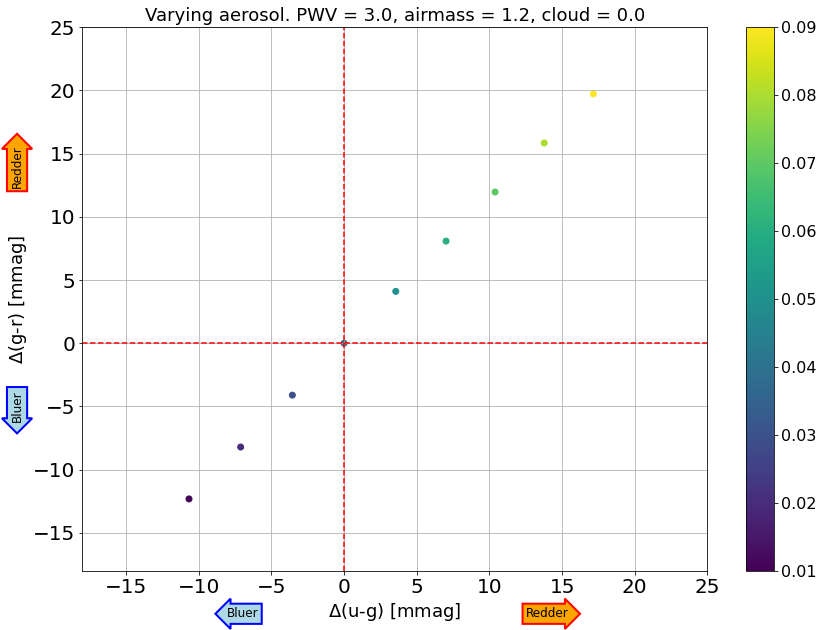

In [87]:
colorx = 'u-g'
colory = 'g-r'
plt.figure(figsize=(14,10))
delta1 = (colour_dict[test_type][test_spec][colorx.lower()]-colour_dict_ref[test_type][test_spec][colorx.lower()])*1000.
delta2 = (colour_dict[test_type][test_spec][colory.lower()]-colour_dict_ref[test_type][test_spec][colory.lower()])*1000.
plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(-18,25)
plt.ylim(-18,25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)
plt.text(-22.5,-5.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(-22.5,14.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
plt.text(-7.,-21.4,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(14.,-21.4,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
plt.title('Varying {0}. PWV = {1}, airmass = {2}, cloud = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=18)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_colour_colour_plot_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

Select Delta_color ranges 

In [88]:
rangex = (-18,25)
rangey = (-18,25)

Now we evaluate the colour - colour plot for all spectra of the example spectral type: 

In [89]:
save_plot = True

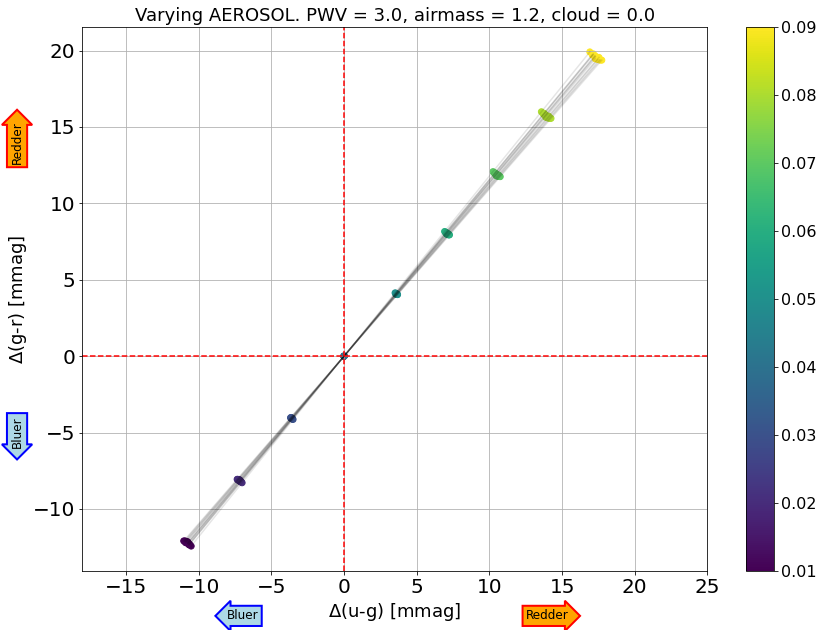

In [90]:
colorx = 'u-g'
colory = 'g-r'
plt.figure(figsize=(14,10))
for si in colour_dict[test_type]:
    delta1 = (colour_dict[test_type][si][colorx.lower()]-colour_dict_ref[test_type][si][colorx.lower()])*1000.
    delta2 = (colour_dict[test_type][si][colory.lower()]-colour_dict_ref[test_type][si][colory.lower()])*1000.
    plt.plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
    plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(rangex)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)

plt.text(-22.5,-5.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(-22.5,14.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
plt.text(-7.,-17.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(14.,-17.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))

if save_plot:
    if variable_param=='airmass' or variable_param=='cloud':
        plt.title('Varying {0}'.format(variable_param.upper()),fontsize=18)
    else:
        plt.title('Varying {0}. PWV = {1}, airmass = {2}, cloud = {3}'.format(variable_param.upper(),pwv0,am0,cloud0),fontsize=18)
    if variable_param=='airmass' or variable_param=='cloud':
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying{1}.png'.format(test_type,variable_param)))
    else:
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying_{1}_airmass_{2}_cloud_{3}.png'.format(test_type,variable_param,am0,cloud0)))


Let's evaluate the same colour - colour plot for the different spectral types: 

O
B
A
F
G
K
M


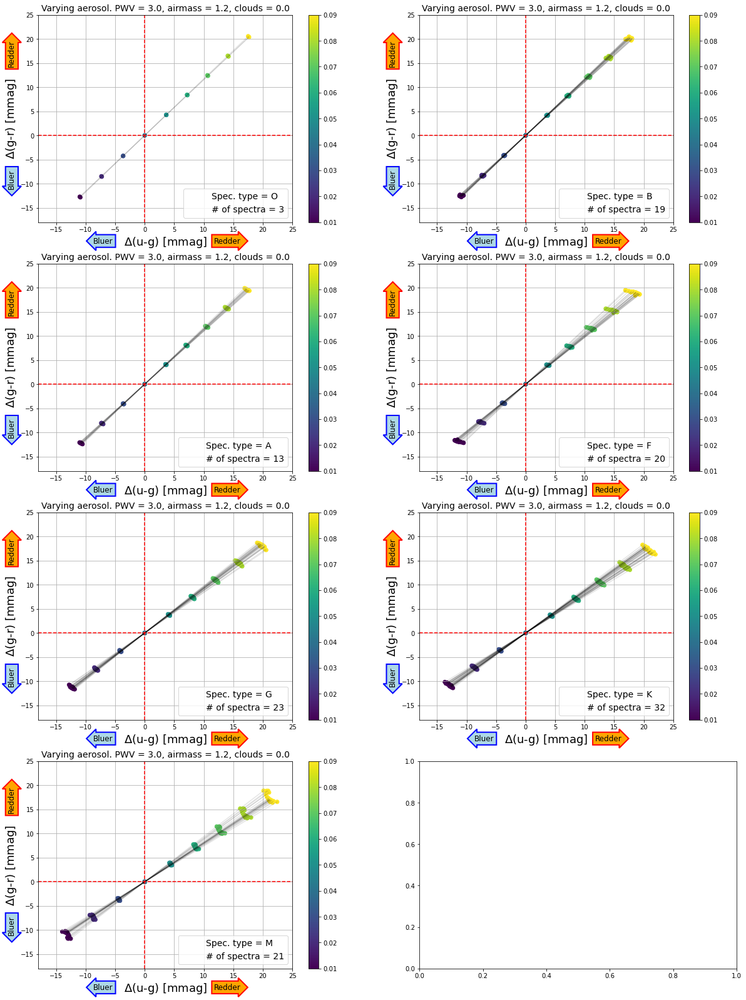

In [91]:
colorx = 'u-g'
colory = 'g-r'

fig_rows = 4
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,28))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(spectral_types):
            spec_type = spectral_types[i]
            print(spec_type)
            
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][colorx.lower()]-colour_dict_ref[spec_type][si][colorx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][colory.lower()]-colour_dict_ref[spec_type][si][colory.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(spec_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[spec_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            
            axs[row,col].text(-22.5,-9.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(-22.5,17.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            axs[row,col].text(-7.,-21.9,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(14.,-21.9,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            
            i += 1


Now we evaluate the different colour - colour plots for the example spectral type: 

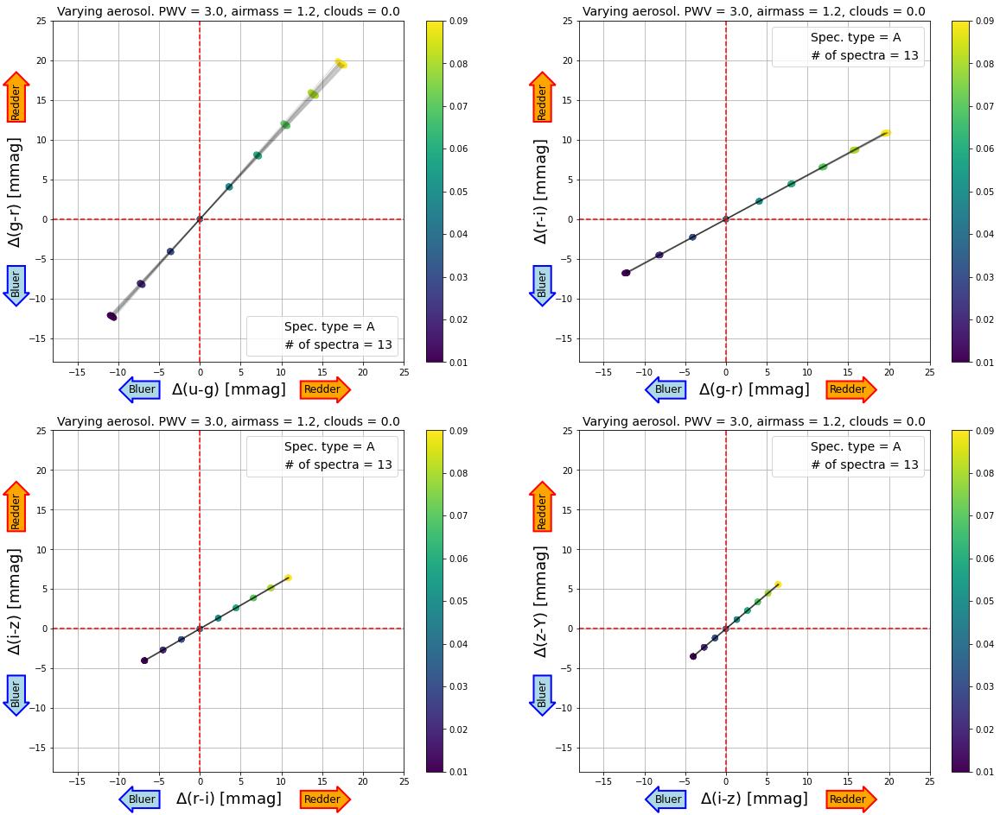

In [92]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for si in colour_dict[test_type]:
                delta1 = (colour_dict[test_type][si][cx.lower()]-colour_dict_ref[test_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[test_type][si][cy.lower()]-colour_dict_ref[test_type][si][cy.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            #axs[row,col].set_xlim(-0.012,0.021)
            #axs[row,col].set_ylim(-0.065,0.126)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(test_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[test_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            
            axs[row,col].text(-22.5,-8.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(-22.5,15.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            axs[row,col].text(-7.,-21.5,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(15.,-21.5,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            
            i += 1

Let's have a look now at the colour-colour plots for all spectral types together 

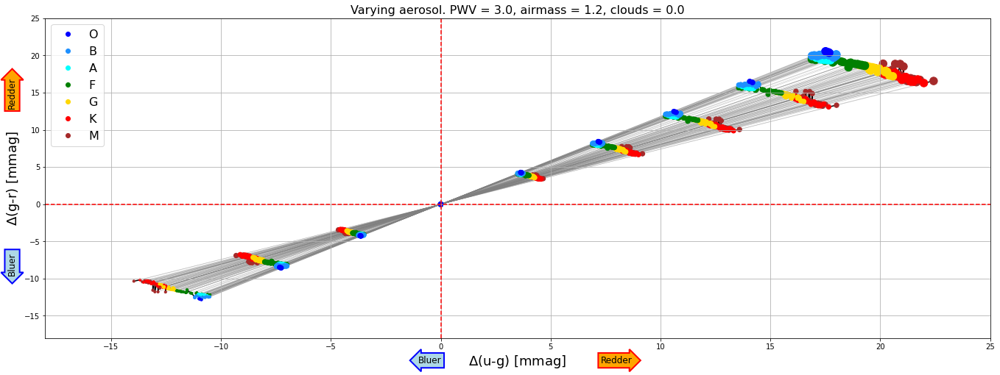

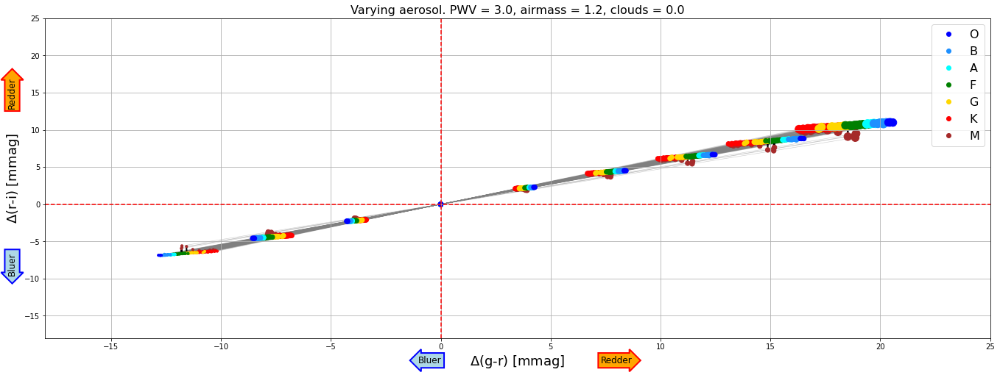

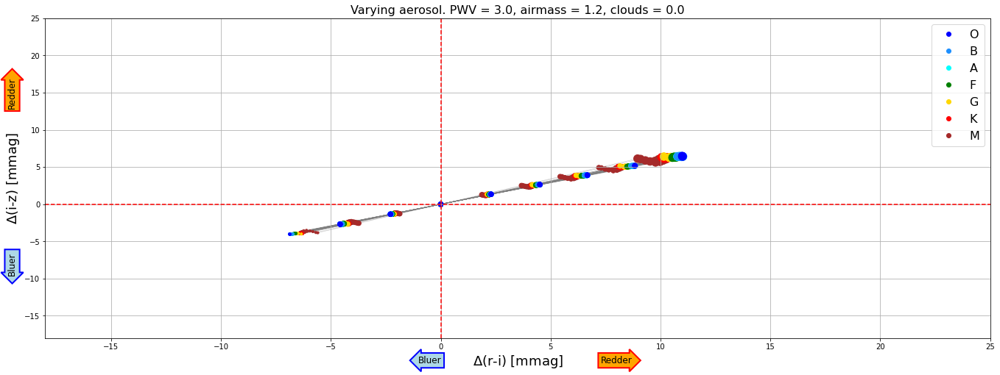

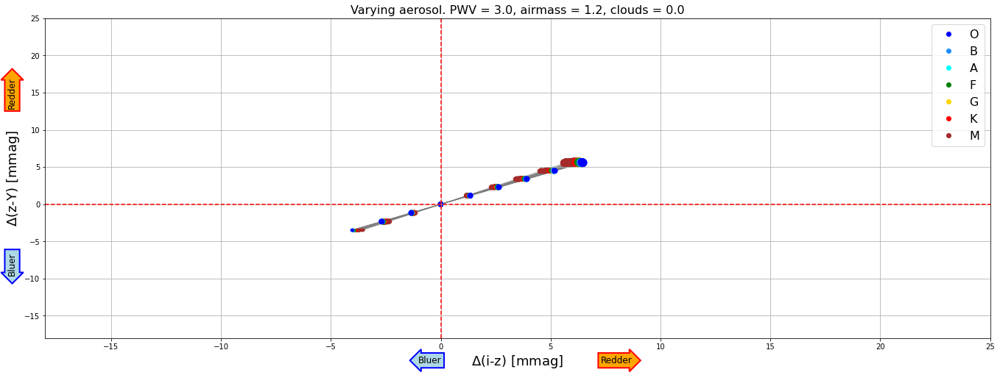

In [93]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(23,8))
    if i<len(filters)-2:
        cx = '{0}-{1}'.format(filters[i],filters[i+1])
        cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangex)
        axs.set_ylim(rangey)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)
        axs.legend(fontsize=16)
        
        axs.text(-19.5,-8.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-19.5,15.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-0.5,-21.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(8.,-21.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0,cx,cy)))

# Calculate colour evolution for SN Ia spectra 

We use the SNe Ia spectra from https://github.com/rhiannonlynne/photometry_sample/tree/main/sn 

In [94]:
sne_path = 'data/SNIa_spectra/'
sn1_data = np.loadtxt(os.path.join(sne_path,'sn1a_10.0.dat'))
sn2_data = np.loadtxt(os.path.join(sne_path,'sn1a_15.0.dat'))
sn3_data = np.loadtxt(os.path.join(sne_path,'sn1a_20.0.dat'))

The wavelengths are in nm and the fluxes in erg/s/cm2/nm, so we need to change the units to angstrom and photlam = #photons/s/cm2/angstrom (pysynphot assumes that the input fluxes are in photlam). For this, we need to remember that the conversion between flam (erg/s/cm2/angstrom) and photlam is given by 

$$ photlam = \frac{\lambda}{h \cdot c} flam $$

In [95]:
sn1wave = sn1_data[:,0]*10.
sn2wave = sn2_data[:,0]*10.
sn3wave = sn3_data[:,0]*10.

sn1flux = sn1_data[:,1]*sn1wave/(h_planck*c_light)
sn2flux = sn2_data[:,1]*sn2wave/(h_planck*c_light)
sn3flux = sn3_data[:,1]*sn3wave/(h_planck*c_light)

In [96]:
sn1 = S.ArraySpectrum(sn1wave,sn1flux,name='sn1a_10.0')
sn2 = S.ArraySpectrum(sn2wave,sn2flux,name='sn1a_15.0')
sn3 = S.ArraySpectrum(sn3wave,sn3flux,name='sn1a_20.0')

In [97]:
sn1.waveunits, sn1.fluxunits

(<pysynphot.units.Angstrom at 0x7faca6fa58b0>,
 <pysynphot.units.Photlam at 0x7fac9e288d60>)

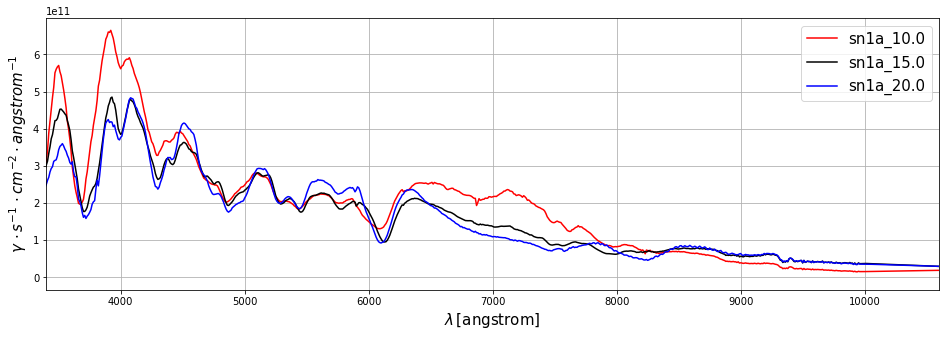

In [98]:
fig=plt.figure(figsize=(16,5))
plt.plot(sn1.wave,sn1.flux,color='r',label=sn1.name)
plt.plot(sn2.wave,sn2.flux,color='k',label=sn2.name)
plt.plot(sn3.wave,sn3.flux,color='b',label=sn3.name)
plt.xlim(WLMIN,WLMAX)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot s^{-1} \, \cdot cm^{-2} \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=15)

Now we pass the SNIa spectra through the total passbands, as with the calibration spectra 

In [99]:
sn_list = [sn1,sn2,sn3]

In [100]:
# SNe Ia through atm x throughput 
sn_obs_dict = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    sn_obs_dict[si] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [101]:
print(len(sn_obs_dict.keys()))
print(len(sn_obs_dict[0].keys()))
print(len(sn_obs_dict[0]['u']))

3
6
9


In [102]:
# SNe Ia only through throughput (as if telescope was in space) 
sn_obs_dict_t = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    sn_obs_dict_t[si] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

In [103]:
print(len(sn_obs_dict_t.keys()))
print(len(sn_obs_dict_t[0].keys()))
print(sn_obs_dict_t[0]['u'].flux)

3
6
[0. 0. 0. ... 0. 0. 0.]


Text(0.5, 1.0, 'Varying aerosol. PWV = 3.0, airmass = 1.2, clouds = 0.0')

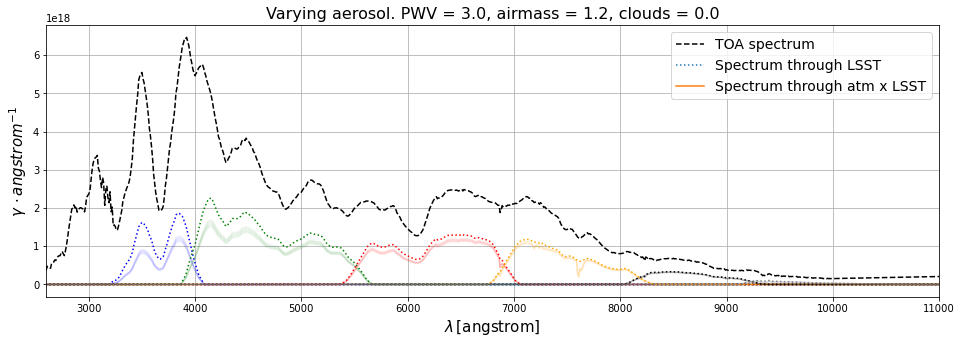

In [104]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)

We zoom in to see the effect of the different atmospheric transparencies 

Text(0.5, 1.0, 'Varying aerosol. PWV = 3.0, airmass = 1.2, clouds = 0.0')

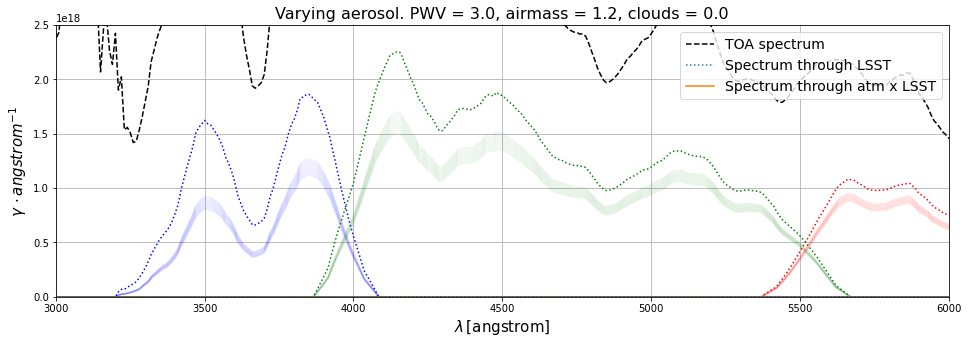

In [105]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.07)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(3000.,6000.)
plt.ylim(0,2.5e18)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)

We can now calculate the magnitudes and colours 

In [106]:
# Magnitudes of spectra passing through atm x throughput 
sn_mag_dict = {}
sn_mag_dict_ref = {}
sn_mag_err_dict = {}
sn_mag_err_dict_ref = {}
for si,obs_spec_ in enumerate(sn_list):
    mag_dict_ = {}
    mag_dict_ref_ = {}
    mag_err_dict_ = {}
    mag_err_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        mag_err_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            if calc_mag_err:
                mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True)
                mag_err_dict_[filter].append(mag_err_ab_)
            else:
                mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        if calc_mag_err:
            mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True)
            mag_err_dict_ref_[filter] = mag_err_ab_
        else:
            mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    sn_mag_dict[si] = mag_dict_
    sn_mag_dict_ref[si] = mag_dict_ref_
    sn_mag_err_dict[si] = mag_err_dict_
    sn_mag_err_dict_ref[si] = mag_err_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 5.24e+20
Numerator = 5.24e+20
Variance of the numerator = 9.58e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.573877005476774
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 5.16e+20
Numerator = 5.16e+20
Variance of the numerator = 9.27e+1

n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 1.30e+21
Numerator = 1.30e+21
Variance of the numerator = 5.60e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.814250996533143
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 1.29e+21
Numerator = 1.29e+21
Variance of the numerator = 5.50e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.80459976681

n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 2.57e+20
Numerator = 2.57e+20
Variance of the numerator = 1.06e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -19.80311733352637
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 2.55e+20
Numerator = 2.55e+20
Variance of the numerator = 1.05e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -19.796468368344

n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.59e+21
Numerator = 1.59e+21
Variance of the numerator = 5.77e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.71475269586523
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.57e+21
Numerator = 1.57e+21
Variance of the numerator = 5.63e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.700698431505

n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 5.69e+20
Numerator = 5.69e+20
Variance of the numerator = 2.48e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.24234134683613
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 3.23e+20
Numerator = 3.23e+20
Variance of the numerator = 1.39e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -20.052353136966

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 3.29e+20
Numerator = 3.29e+20
Variance of the numerator = 5.41e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.06764628718901
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 3.23e+20
Numerator = 3.23e+20
Variance of the numerator = 5.24e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.050244696846

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 5.03e+20
Numerator = 5.03e+20
Variance of the numerator = 2.25e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.108851940968314
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 5.00e+20
Numerator = 5.00e+20
Variance of the numerator = 2.22e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.10126722184

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.07e+20
Numerator = 1.07e+20
Variance of the numerator = 2.32e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.52883693132414
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.06e+20
Numerator = 1.06e+20
Variance of the numerator = 2.30e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.523306544716

In [107]:
print(len(sn_mag_dict.keys()))
print(len(sn_mag_dict[0].keys()))
print(len(sn_mag_dict[0]['u']))

3
6
9


In [108]:
sn_colour_dict = {}
sn_colour_err_dict = {}
for sn in sn_mag_dict.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict[sn] = c_dict
    sn_colour_err_dict[sn] = c_err_dict


In [109]:
print(len(sn_mag_dict.keys()))
print(len(sn_colour_dict.keys()))
print(len(sn_colour_dict[0].keys()))
print(len(sn_colour_dict[0]['u-g']))

3
3
5
9


In [110]:
sn_colour_dict_ref = {}
sn_colour_err_dict_ref = {}
for sn in sn_mag_dict_ref.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict_ref[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict_ref[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict_ref[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict_ref[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict_ref[sn] = c_dict
    sn_colour_err_dict_ref[sn] = c_err_dict
    

In [111]:
print(len(sn_mag_dict_ref.keys()))
print(len(sn_colour_dict_ref.keys()))
print(len(sn_colour_dict_ref[0].keys()))
print(sn_colour_dict_ref[0]['u-g'])

3
3
5
0.273046167203578


In [112]:
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_dict)
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_dict_ref)
if calc_mag_err:
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict)
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict_ref)

In [113]:
rangex2 = (-25,30)
rangey2 = (-25,30)

Now we add the evolution of the flat spectrum, for reference 

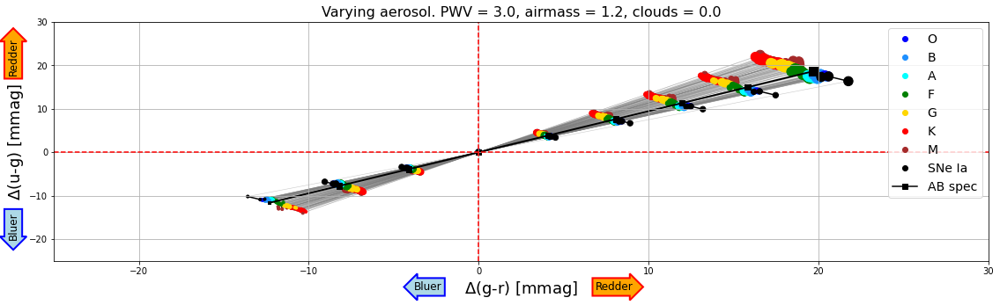

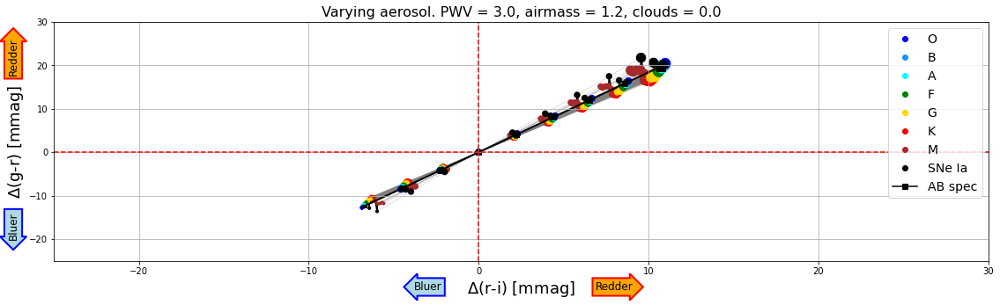

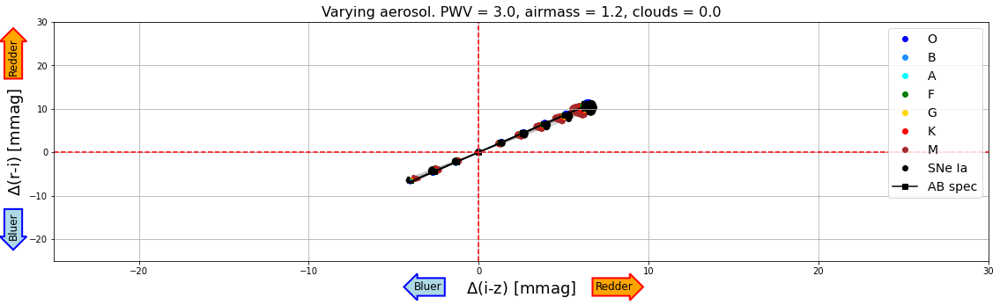

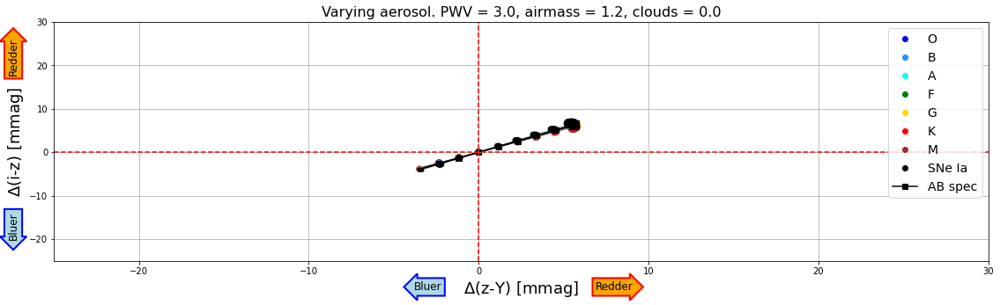

In [114]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(19,5))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])#################
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])#################
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        delta1_flat = (flat_colour_dict[cx.lower()]-flat_colour_dict_ref[cx.lower()])*1000.
        delta2_flat = (flat_colour_dict[cy.lower()]-flat_colour_dict_ref[cy.lower()])*1000.
        axs.scatter(delta1_flat,delta2_flat,c='k',marker='s',s=msize)
        axs.plot(delta1_flat,delta2_flat,ls='-',linewidth=2.0,marker='',color='k',alpha=1.0,zorder=1)
        axs.plot([],[],c='k',ls='-',marker='s',label='AB spec')
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangey2)#################
        axs.set_ylim(rangex2)#################
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        
        axs.text(-27.4,-17.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-27.4,22.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-3.,-31.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(8.,-31.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}_sn_flat_spectrum.png'.format(variable_param,am0,cloud0,cx,cy)))

# Redshift the SN Ia spectra 

In [115]:
redshifts = np.linspace(0.1,1.0,10)
print(redshifts)

[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


In [116]:
redshift_colors = {0.1:'b',0.2:'dodgerblue',0.3:'cyan',0.4:'g',0.5:'gold',0.6:'r',0.7:'brown',0.8:'grey',0.9:'darkgrey',1.0:'k'}

Apply redshift to the spectrum of one of the SN Ia 

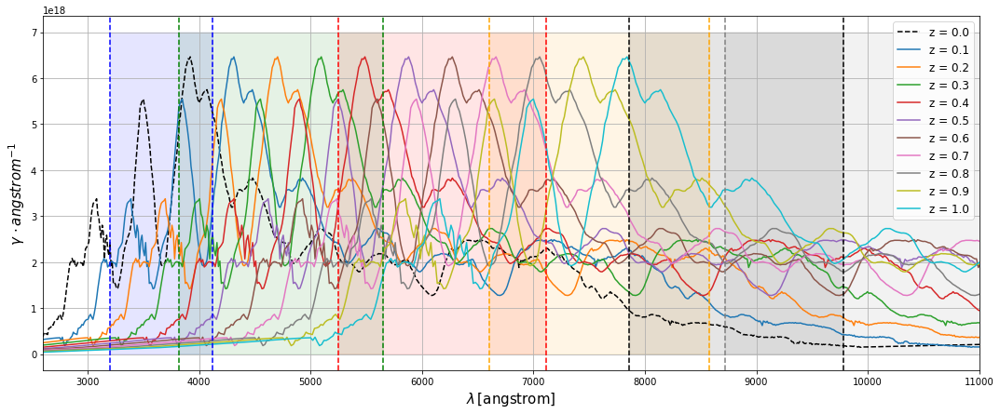

In [117]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
rs_dict = {}
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,label='z = {0:.1f}'.format(redshift))
    rs_dict[round(redshift,1)] = sn1_z
    
# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*7e18,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*7e18,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*7e18,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*7e18,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*7e18,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*7e18,color=filter_colors[5],alpha=0.1)

plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

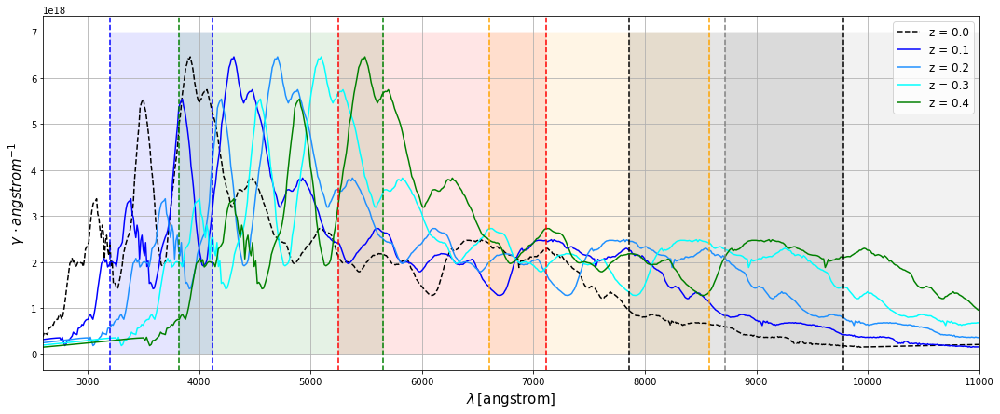

In [118]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts[:4]:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,color=redshift_colors[np.round(redshift,1)],label='z = {0:.1f}'.format(redshift))
    

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*7e18,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*7e18,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*7e18,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*7e18,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*7e18,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*7e18,color=filter_colors[5],alpha=0.1)


plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

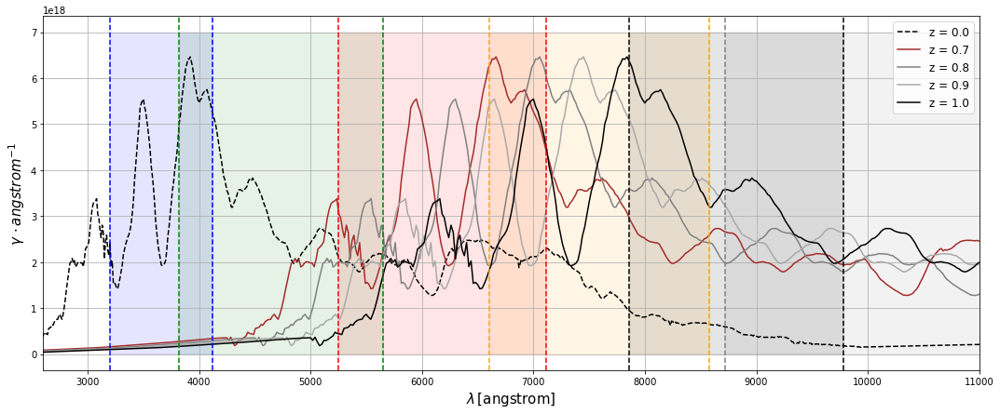

In [119]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts[6:]:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,color=redshift_colors[np.round(redshift,1)],label='z = {0:.1f}'.format(redshift))
    

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*7e18,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*7e18,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*7e18,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*7e18,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*7e18,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*7e18,color=filter_colors[5],alpha=0.1)


plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

Compute fluxes through atm x throughput 

In [120]:
# redshifted SN Ia through atm x throughput 
rs_sn_obs_dict = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    rs_sn_obs_dict[key] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [121]:
# redshifted SN Ia only through throughput (as if telescope was in space) 
rs_sn_obs_dict_t = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    rs_sn_obs_dict_t[key] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

Text(0.5, 1.0, 'Varying aerosol. PWV = 3.0, airmass = 1.2, clouds = 0.0')

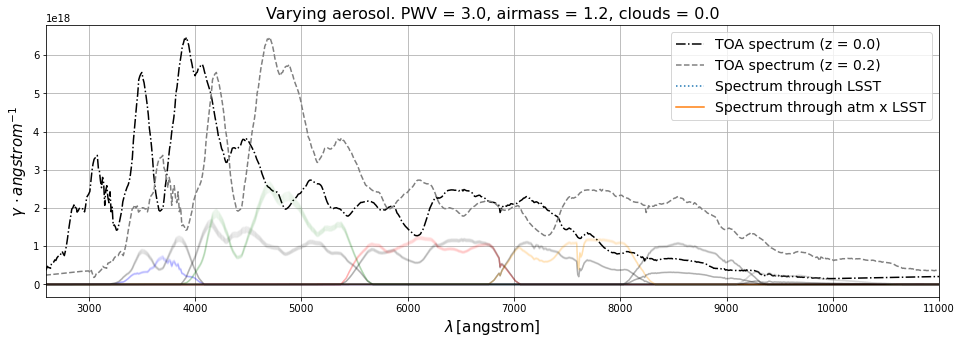

In [122]:
test_rs = 0.2
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='-.',color='k',label='TOA spectrum (z = 0.0)')
plt.plot(rs_dict[test_rs].wave,rs_dict[test_rs].flux*Seff*exptime,ls='--',color='grey',label='TOA spectrum (z = {0})'.format(test_rs))

for index,filter in enumerate(filters):
    #plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color='k')
    #plt.plot(rs_sn_obs_dict_t[test_rs][filter].wave,rs_sn_obs_dict_t[test_rs][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        obs_0 = sn_obs_dict[0][filter][i]
        obs_ = rs_sn_obs_dict[test_rs][filter][i]
        plt.plot(obs_0.wave,obs_0.flux*Seff*exptime,ls='-',color='k',alpha=0.04)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)

Now we calculate the magnitudes and colours 

In [123]:
# Magnitudes of spectra passing through atm x throughput 
rs_sn_mag_dict = {}
rs_sn_mag_dict_ref = {}
for key in rs_dict.keys():
    obs_spec_ = rs_dict[key]
    mag_dict_ = {}
    mag_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    rs_sn_mag_dict[key] = mag_dict_
    rs_sn_mag_dict_ref[key] = mag_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.07e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.300001736390904
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.01e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.282438018212503
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Ob

Numerator = 1.31e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.148638398417035
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.30e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.141093211933843
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.29e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 2.62e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.819507581545956
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.57e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.802101094766055
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.53e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 1.21e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.056938393698424
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.10e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.175110597851436
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.04e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 2.34e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -21.13640364918637
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.31e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -21.123035177715956
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.28e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Denominator = 3.08e+12
AB magnitude =  -21.34755655574132
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.06e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.340963145197943
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.05e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.3343730303307
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the w

Numerator = 1.85e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.88238331881332
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.83e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.86909379700557
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.95e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 5.69e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.34615495051072
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.67e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.34109679441289
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.64e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 2.68e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.594277841794757
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.65e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.584312226382522
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.63e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 5.91e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.386765153696764
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.74e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.707018471847483
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.68e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 1.68e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.415344952313426
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.66e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.40776038105389
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.65e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 2.78e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.38461681906502
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.01e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.471790937497765
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.83e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.08e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.365941649729315
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.08e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.35972449881089
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.07e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 6.12e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -19.67985209903032
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.07e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.315183342718775
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.05e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 5.62e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.332546077026223
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.60e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.3274874549502
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.57e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.176344478392537
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.80e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.16663689900038
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.89e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitud

Denominator = 3.09e+12
AB magnitude =  -16.945740297022333
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.82e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -16.92814602037268
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.79e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -16.910552138432376
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.912338557028672
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.63e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.904591438576592
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.61e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitu

In [124]:
rs_sn_colour_dict = {}
for rs in rs_sn_mag_dict.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict[rs] = c_dict

rs_sn_colour_dict_ref = {}
for rs in rs_sn_mag_dict_ref.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict_ref[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict_ref[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict_ref[rs] = c_dict
    

In [125]:
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict)
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict_ref)

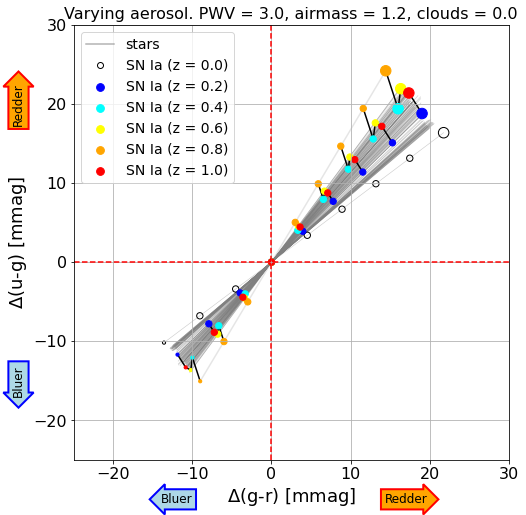

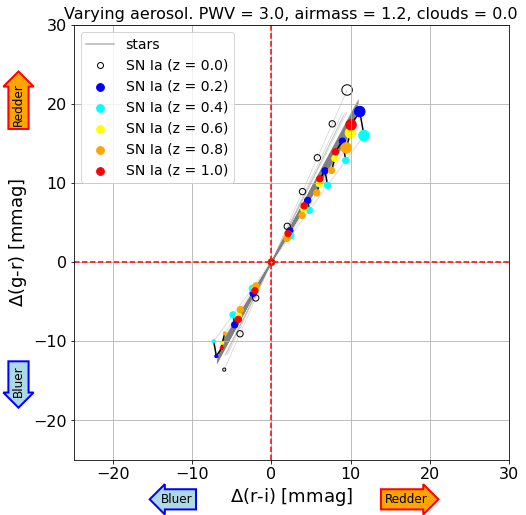

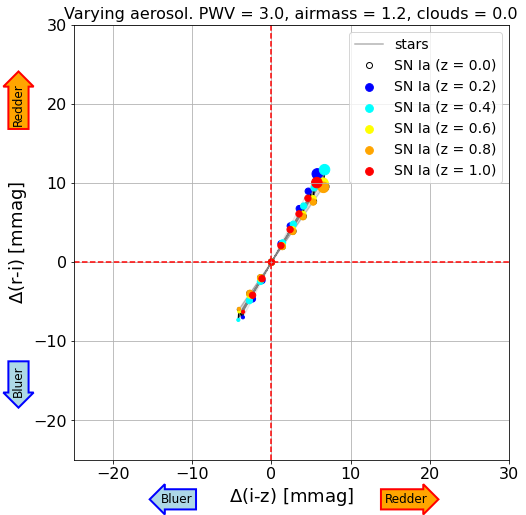

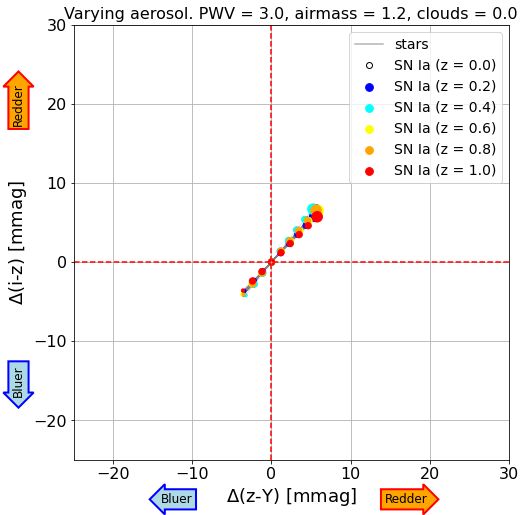

In [126]:
fig_rows = len(filters)-2

sel_sn = 0

redshifts_ = [0.2,0.4,0.6,0.8,1.0]
rs_colors = {0.2:'b',0.4:'cyan',0.6:'yellow',0.8:'orange',1.0:'r'}

i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(18,8))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                #iso_vals1.append(delta1)
                #iso_vals2.append(delta2)
                    
                #axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
                
        #for spec_type in spectral_types:
        #    axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
        axs.plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
            
        for si,sn in enumerate(sn_colour_dict.keys()):
            if si==sel_sn:
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                #iso_vals1.append(delta1_sn)
                #iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,facecolors='none', edgecolors='k',s=msize)
                #else:
                #    axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',fillstyle='none',label='SN Ia (z = 0.0)')    
        
        #for rs in rs_sn_colour_dict.keys():
        for rs in redshifts_:
            delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
            delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
            msize = [10.]
            msize = msize+[40.]*(len(delta1)-2)
            msize.append(110.)
            
            iso_vals1.append(delta1_rs_sn)
            iso_vals2.append(delta2_rs_sn)
            
            axs.scatter(delta1_rs_sn,delta2_rs_sn,c=rs_colors[rs],marker='o',s=msize,label='SN Ia (z = {0})'.format(rs))
            axs.plot(delta1_rs_sn,delta2_rs_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        axs.tick_params(axis='x', labelsize=16)
        axs.tick_params(axis='y', labelsize=16)
        axs.set_xlim(rangey2)
        axs.set_ylim(rangex2)
        axs.set_aspect('equal')
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        
        axs.text(-32.,-15.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-32.,20.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-12.,-30.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(17.,-30.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        
        i += 1

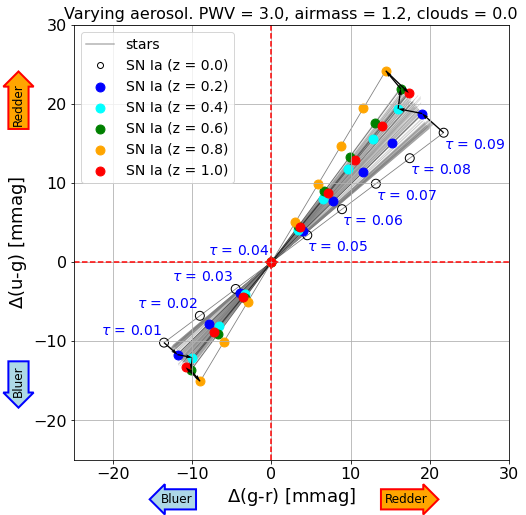

In [127]:
fig_rows = 1

sel_sn = 0

redshifts_ = [0.2,0.4,0.6,0.8,1.0]
rs_colors = {0.2:'b',0.4:'cyan',0.6:'g',0.8:'orange',1.0:'r'}

i = 0
if True:
    if True:
        fig, axs = plt.subplots(1, 1, figsize=(18,8))
        cy = 'u-g'
        cx = 'g-r'
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
                
        axs.plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
            
        for si,sn in enumerate(sn_colour_dict.keys()):
            if si==sel_sn:
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,facecolors='none', edgecolors='k',s=80.)
                
                for i in range(len(delta1_sn)):
                    if i<=3:
                        xshift = -8.
                        yshift = 1.
                    else:
                        xshift = 0.
                        yshift = -2.
                    axs.text(delta1_sn[i]+xshift,delta2_sn[i]+yshift,r'$\tau$ = {0:.2f}'.format(atm_vals[i]),color='b',rotation=0,size=14)
                
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.8,marker='',color='k',alpha=0.5,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',fillstyle='none',label='SN Ia (z = 0.0)')    
        
        
        for rs in redshifts_:
            delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
            delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
            msize = [10.]
            msize = msize+[40.]*(len(delta1)-2)
            msize.append(110.)
            
            iso_vals1.append(delta1_rs_sn)
            iso_vals2.append(delta2_rs_sn)
            
            axs.scatter(delta1_rs_sn,delta2_rs_sn,c=rs_colors[rs],marker='o',s=80.,label='SN Ia (z = {0})'.format(rs))
            axs.plot(delta1_rs_sn,delta2_rs_sn,ls='-',linewidth=0.8,marker='',color='k',alpha=0.5,zorder=-1)
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        
        #axs.plot(iso_vals1[:,0],iso_vals2[:,0],ls='-',marker='',color='k',zorder=-1)
        #axs.plot(iso_vals1[:,-1],iso_vals2[:,-1],ls='-',marker='',color='k',zorder=-1)
        
        iso_vals1_min = iso_vals1[:,0]
        iso_vals1_max = iso_vals1[:,-1]
        iso_vals2_min = iso_vals2[:,0]
        iso_vals2_max = iso_vals2[:,-1]
        
        axs.quiver(iso_vals1_min[:-1],iso_vals2_min[:-1],iso_vals1_min[1:]-iso_vals1_min[:-1],iso_vals2_min[1:]-iso_vals2_min[:-1],scale_units='xy',angles='xy',scale=1,width=0.003)
        axs.quiver(iso_vals1_max[:-1],iso_vals2_max[:-1],iso_vals1_max[1:]-iso_vals1_max[:-1],iso_vals2_max[1:]-iso_vals2_max[:-1],scale_units='xy',angles='xy',scale=1,width=0.003)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        axs.tick_params(axis='x', labelsize=16)
        axs.tick_params(axis='y', labelsize=16)
        axs.set_xlim(rangey2)
        axs.set_ylim(rangex2)
        axs.set_aspect('equal')
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. PWV = {1}, airmass = {2}, clouds = {3}'.format(variable_param,pwv0,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        
        axs.text(-32.,-15.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-32.,20.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-12.,-30.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(17.,-30.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        
        i += 1